# Imports

In [ ]:
from io import StringIO

import json

import numpy as np

import seaborn as sns

import pandas as pd
from pandas.plotting import scatter_matrix
from pandas import ExcelWriter
from pandas import ExcelFile

import matplotlib
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from sklearn import preprocessing

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB

# Cargar datos

## From Local to Colab

In [ ]:
from google.colab import files #cargar archivos locales

In [ ]:
uploaded = files.upload()
ficheros = []
for fn in uploaded.keys():
  ficheros.append(fn)
s=str(uploaded.get(ficheros[0]),'utf-8')
data = StringIO(s)
df = pd.read_csv(data, nrows = 100000)

Saving telecom_churn.csv to telecom_churn.csv


## From Local to Local

In [ ]:
df = pd.read_csv("./telecom_churn.csv", nrows = 100000)

# Explicación de los datos

Origen de los datos:
[Kaggle, Customer Churn](https://www.kaggle.com/datasets/barun2104/telecom-churn?resource=download)

Descripción de las columnas:
+ **Churn**: 1 si el cliente cancela el servicio, 0 si no ha cancelado el servicio.
+ **AccountWeeks**: número de semanas que el cliente ha tenido activa la cuenta.
+ **ContractRenewal**: 1 si el cliente ha renovado recientemente el contrato, 0 en caso contrario.
+ **DataPlan**: 1 si el cliente tiene plan de datos, 0 en caso contrario.
+ **DataUsage**: uso de datos en gigabytes al mes
+ **CustServCalls**: número de llamadas al servicio de atención al cliente.
+ **DayMins**: media de minutos diurnos al mes.
+ **DayCalls**: número medio de llamadas diurnas.
+ **MonthlyCharge**: factura media mensual.
+ **OverageFee**: mayor tasa por excedente en los últimos 12 meses.
+ **RoamMins**: promedio de minutos de itinerancia

## Previsualización de los datos

In [ ]:
df.head()

,Churn,AccountWeeks,ContractRenewal,DataPlan,DataUsage,CustServCalls,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins
0,0,128,1,1,2.7,1,265.1,110,89.0,9.87,10.0
1,0,107,1,1,3.7,1,161.6,123,82.0,9.78,13.7
2,0,137,1,0,0.0,0,243.4,114,52.0,6.06,12.2
3,0,84,0,0,0.0,2,299.4,71,57.0,3.10,6.6
4,0,75,0,0,0.0,3,166.7,113,41.0,7.42,10.1


## Cantidad de datos

In [ ]:
df.shape

(3333, 11)

## Columnas

In [ ]:
df.columns

Index(['Churn', 'AccountWeeks', 'ContractRenewal', 'DataPlan', 'DataUsage',
       'CustServCalls', 'DayMins', 'DayCalls', 'MonthlyCharge', 'OverageFee',
       'RoamMins'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Churn            3333 non-null   int64  
 1   AccountWeeks     3333 non-null   int64  
 2   ContractRenewal  3333 non-null   int64  
 3   DataPlan         3333 non-null   int64  
 4   DataUsage        3333 non-null   float64
 5   CustServCalls    3333 non-null   int64  
 6   DayMins          3333 non-null   float64
 7   DayCalls         3333 non-null   int64  
 8   MonthlyCharge    3333 non-null   float64
 9   OverageFee       3333 non-null   float64
 10  RoamMins         3333 non-null   float64
dtypes: float64(5), int64(6)
memory usage: 286.6 KB


# Copia del dataset original

In [ ]:
dfo = df.copy()

# Funciones a usar

In [ ]:
def analisisNulos (dfN, log):
  conteo = dfN.isnull().sum().sort_values(ascending = False)

  na_ratio = ((dfN.isnull().sum() / len(dfN))*100).sort_values(ascending = False)

  if (log):
    print('Cantidad de datos por columna\n')
    dfN.info()
    print('\nCantidad de nulos\n', conteo)
    print('\nPorcentaje de nulos\n', na_ratio)

def contarValoresDiferentes (dfN):
  for columna in dfN:
    print(columna, ': ', dfN[columna].nunique())

def diagramaCajaBigotes (dfN, listaColumnas):
  fig, ax = plt.subplots(nrows=len(listaColumnas), ncols=1, figsize=(8,30))
  fig.subplots_adjust(hspace=0.5)
  
  for i, col in enumerate(listaColumnas):
    sns.boxplot(x=col, data=dfN, ax=ax[i])

def diagramaValoresDiferentes (dfN, listaColumnas):
  fig, ax = plt.subplots(nrows=len(listaColumnas), ncols=1, figsize=(10,30))
  fig.subplots_adjust(hspace=1)
  
  for i, col in enumerate(listaColumnas):
    sns.boxplot(x=col, data=dfN, ax=ax[i])
    ax[i].set_title(col)
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=30)

def transformarMinusculas (dfN, listaColumnas):
  for columna in dfN.columns:
    if columna in listaColumnas:
      dfN[columna] = dfN[columna].str.lower()

def histogramas (dfN, listaColumnas):
  fig, ax = plt.subplots(nrows=len(listaColumnas), ncols=1, figsize=(20,80))
  fig.subplots_adjust(hspace=0.5)

  for i, col in enumerate(listaColumnas):
    sns.histplot(x=col, data=dfN, ax=ax[i], kde=True)
    ax[i].set_title(col)

def matrizCorrelacion (dfN, log):
  #dfN.corr()#Solo con pandas

  plt.figure(figsize = (20, 7))
  heatmap = sns.heatmap(dfN.corr(), cmap = 'viridis', annot = True)
  matrizN = heatmap.set_title('Matriz de Correlación', fontdict = {'fontsize': 25}, pad = 12)

  if(log):
    print(matrizN)

  return matrizN

def graficarTasasConversion (dfN, varPredicctora, varPredecir, type='line', order=None):
  x, y = varPredicctora, varPredecir

  grupo = dfN.groupby(x)[y].mean().mul(100).rename('tasa_conv').reset_index()

  if type == 'line':
    plt.figure(figsize=(40,10))
    sns.lineplot(x=varPredicctora, y='tasa_conv', data=grupo)
    plt.grid()
  elif type == 'bar':
    plt.figure(figsize=(14,6))
    sns.barplot(x=varPredicctora, y='tasa_conv', data=grupo, order=order)
    plt.grid()
  elif type == 'scatter':
    plt.figure(figsize=(40,10))
    sns.scatterplot(x=varPredicctora, y='tasa_conv', data=grupo)
    plt.grid()

def graficar_tc_bivariada (dfN, varPredecir, listaPredictora2, order=None):
  tc = dfN.groupby(listaPredictora2)[varPredecir].mean().to_frame().reset_index()

  plt.figure(figsize=(30,10))
  ax = sns.pointplot(x=tc[varPredecir], y=tc[listaPredictora2[0]], hue=tc[listaPredictora2[1]], join=False)
  ax.yaxis.grid(True)
  ax.xaxis.grid(True)
  plt.title(f'Tasa de conversión para {listaPredictora2[0]} y {listaPredictora2[1]}')
  plt.xlabel('Tasa de conversión (%)')
  plt.xlim((0,1))

def matriz_de_confusion (clases_reales, clases_predichas, titulo):
  matriz = confusion_matrix(clases_reales, clases_predichas)
  exactitud = accuracy_score(clases_reales, clases_predichas)

  #Graficar
  plt.figure(figsize=(4,4))
  matriz = pd.DataFrame(matriz, columns=['0: se queda', '1: se va'])
  plt.matshow(matriz, cmap='summer', vmin=0, vmax=20, fignum=1)
  plt.xticks(range(len(matriz.columns)), matriz.columns, rotation=45)
  plt.yticks(range(len(matriz.columns)), matriz.columns)
  etiquetas = (('Verdaderos\nnegativos', 'Falsos\npositivos'),
               ('Falsos\nnegativos', 'Verdaderos\npositivos'))
  for i in range(len(matriz.columns)):
    for j in range(len(matriz.columns)):
      plt.text(i, j + 0.14, str(matriz.iloc[i, j]), fontsize=30, ha='center', va='center')
      plt.text(i, j + 0.14, etiquetas[i][j], fontsize=11.5, ha='center', va='center')
  
  plt.show()

def loadDatasetML(dataset0, data, target):
  dataset = dataset0

  X = dataset[data]
  y = dataset[target]

  min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 10))
  X = min_max_scaler.fit_transform(X)

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

  return X_train, X_test, y_train, y_test

def predTest(algoritmo, X_test, y_test):
  y_pred = algoritmo.predict(X_test)

  matriz_de_confusion(y_test, y_pred, "grafica")

  matriz = confusion_matrix(y_test, y_pred)
  print("Matriz de confusion")
  print(matriz)

  print("Precision del modelo")
  precision = precision_score(y_test, y_pred, average='micro')
  print(precision)

  print("Exactitud del modelo")
  exactitud = accuracy_score(y_test, y_pred)
  print(exactitud)

  print("Sensibilidad del modelo")
  sensibilidad = recall_score(y_test, y_pred, average='micro')
  print(sensibilidad)

  print("Puntaje F1 del modelo")
  puntajeF1 = f1_score(y_test, y_pred, average='micro')
  print(puntajeF1)

  print("Curva ROC-AUC del modelo")
  roc_auc = roc_auc_score(y_test, y_pred, multi_class='ovr')
  #pred_prob = algoritmo.predict_proba(y_pred)
  #roc_auc = roc_auc_score(y_test, pred_prob)#, multi_class='ovr')
  print(roc_auc)

  return y_pred, matriz, precision

def valancear_datos_under_sampling (dfN, columna_predecir):
  print(dfN[columna_predecir].value_counts())

  #Elegimos la clase menos epresentada
  if dfN[columna_predecir].value_counts()[0] >= dfN[columna_predecir].value_counts()[1]:
    menor = 1
  else:
    menor = 0

  dfN2 = dfN.loc[dfN[columna_predecir]==0].sample(n=dfN[columna_predecir].value_counts()[menor]).copy()
  dfN3 = dfN.loc[dfN[columna_predecir]==1].copy()

  #Unimos las columnas
  dfN4 = pd.concat([dfN2,dfN3], ignore_index=True)
  #Mezclamos aleatoriamente
  dfN4 = dfN4.sample(frac=1)
  #Re-asignamos los indices
  dfN4.reset_index(drop=True, inplace=True)

  return dfN4

# 1. Limpieza de datos

1.1 Datos faltantes

1.2 Columnas irrelevantes

1.3 Duplicados

1.4 Valores extremos

1.5 Errores tipográficos

## 1.1 Datos faltantes

In [ ]:
df.shape

(3333, 11)

### 1.1.1 Comprobamos si faltan datos

In [ ]:
analisisNulos(df, True)

Cantidad de datos por columna

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Churn            3333 non-null   int64  
 1   AccountWeeks     3333 non-null   int64  
 2   ContractRenewal  3333 non-null   int64  
 3   DataPlan         3333 non-null   int64  
 4   DataUsage        3333 non-null   float64
 5   CustServCalls    3333 non-null   int64  
 6   DayMins          3333 non-null   float64
 7   DayCalls         3333 non-null   int64  
 8   MonthlyCharge    3333 non-null   float64
 9   OverageFee       3333 non-null   float64
 10  RoamMins         3333 non-null   float64
dtypes: float64(5), int64(6)
memory usage: 286.6 KB

Cantidad de nulos
 Churn              0
AccountWeeks       0
ContractRenewal    0
DataPlan           0
DataUsage          0
CustServCalls      0
DayMins            0
DayCalls           0
MonthlyCharge      0
Ove

### 1.1.2 Eliminamos los registros que no estén completos

In [ ]:
df.dropna()

,Churn,AccountWeeks,ContractRenewal,DataPlan,DataUsage,CustServCalls,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins
0,0,128,1,1,2.70,1,265.1,110,89.0,9.87,10.0
1,0,107,1,1,3.70,1,161.6,123,82.0,9.78,13.7
2,0,137,1,0,0.00,0,243.4,114,52.0,6.06,12.2
3,0,84,0,0,0.00,2,299.4,71,57.0,3.10,6.6
4,0,75,0,0,0.00,3,166.7,113,41.0,7.42,10.1
...,...,...,...,...,...,...,...,...,...,...,...
3328,0,192,1,1,2.67,2,156.2,77,71.7,10.78,9.9
3329,0,68,1,0,0.34,3,231.1,57,56.4,7.67,9.6
3330,0,28,1,0,0.00,2,180.8,109,56.0,14.44,14.1
3331,0,184,0,0,0.00,2,213.8,105,50.0,7.98,5.0


### 1.1.3 Comprobar que todas las columnas tengan la misma cantidad de datos

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Churn            3333 non-null   int64  
 1   AccountWeeks     3333 non-null   int64  
 2   ContractRenewal  3333 non-null   int64  
 3   DataPlan         3333 non-null   int64  
 4   DataUsage        3333 non-null   float64
 5   CustServCalls    3333 non-null   int64  
 6   DayMins          3333 non-null   float64
 7   DayCalls         3333 non-null   int64  
 8   MonthlyCharge    3333 non-null   float64
 9   OverageFee       3333 non-null   float64
 10  RoamMins         3333 non-null   float64
dtypes: float64(5), int64(6)
memory usage: 286.6 KB


### 1.1.4 Comprobar el tamaño del dataset después de los cambios

In [ ]:
df.shape

(3333, 11)

## 1.2 Columnas irrelevantes


In [ ]:
df.shape

(3333, 11)

### 1.2.1 Eliminar columnas que no sean relevantes para el estudio

In [ ]:
#df.drop(['columna', 'columna'], axis=1)

### 1.2.2 Eliminar columnas que solamente tengan un valor (pj. en la columna "trabajo" solo tenga el valor "asistente", en la columna "edad" solo esté el valor "5")

In [ ]:
contarValoresDiferentes(df)

Churn :  2
AccountWeeks :  212
ContractRenewal :  2
DataPlan :  2
DataUsage :  174
CustServCalls :  10
DayMins :  1667
DayCalls :  119
MonthlyCharge :  627
OverageFee :  1024
RoamMins :  162


In [ ]:
#df.drop(['columna', 'columna'], axis=1)

### 1.2.3 Eliminar columnas con información redundante (pj. una tabla con las columnas "fecha", "día", "mes", "año" podríamos quedarnos solamente con "fecha" ya que incluye los valores de las demás columnas)

In [ ]:
#df.drop(['columna', 'columna'], axis=1)

### 1.2.4 Eliminar columnas que tengan muchos datos vacios

In [ ]:
analisisNulos(df, True)

Cantidad de datos por columna

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Churn            3333 non-null   int64  
 1   AccountWeeks     3333 non-null   int64  
 2   ContractRenewal  3333 non-null   int64  
 3   DataPlan         3333 non-null   int64  
 4   DataUsage        3333 non-null   float64
 5   CustServCalls    3333 non-null   int64  
 6   DayMins          3333 non-null   float64
 7   DayCalls         3333 non-null   int64  
 8   MonthlyCharge    3333 non-null   float64
 9   OverageFee       3333 non-null   float64
 10  RoamMins         3333 non-null   float64
dtypes: float64(5), int64(6)
memory usage: 286.6 KB

Cantidad de nulos
 Churn              0
AccountWeeks       0
ContractRenewal    0
DataPlan           0
DataUsage          0
CustServCalls      0
DayMins            0
DayCalls           0
MonthlyCharge      0
Ove

In [ ]:
#df.drop(['columna', 'columna'], axis=1)

### 1.2.5 Comprobar el tamaño del dataset después de los cambios

In [ ]:
df.shape

(3333, 11)

## 1.3 Duplicados


In [ ]:
df.shape

(3333, 11)

### 1.3.1 Eliminar registros que tengan los mismos valores

In [ ]:
df.drop_duplicates(inplace= True)

### 1.3.2 Comprobar el tamaño del dataset después de los cambios

In [ ]:
df.shape

(3333, 11)

## 1.4 Valores extremos


In [ ]:
df.shape

(3333, 11)

### 1.4.1 Comprobar valores absurdos (pj. edad: -2, edad: 5.6)

#### 1.4.1.1 Comprobamos las columnas categoricas y numericas

In [ ]:
grupos = df.columns.to_series().groupby(df.dtypes).groups
print(grupos)

{int64: ['Churn', 'AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls'], float64: ['DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']}


Las separamos

In [ ]:
categoricas = []
numericas = ['Churn', 'AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls', 'DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']

#### 1.4.1.2 Observamos su distribución

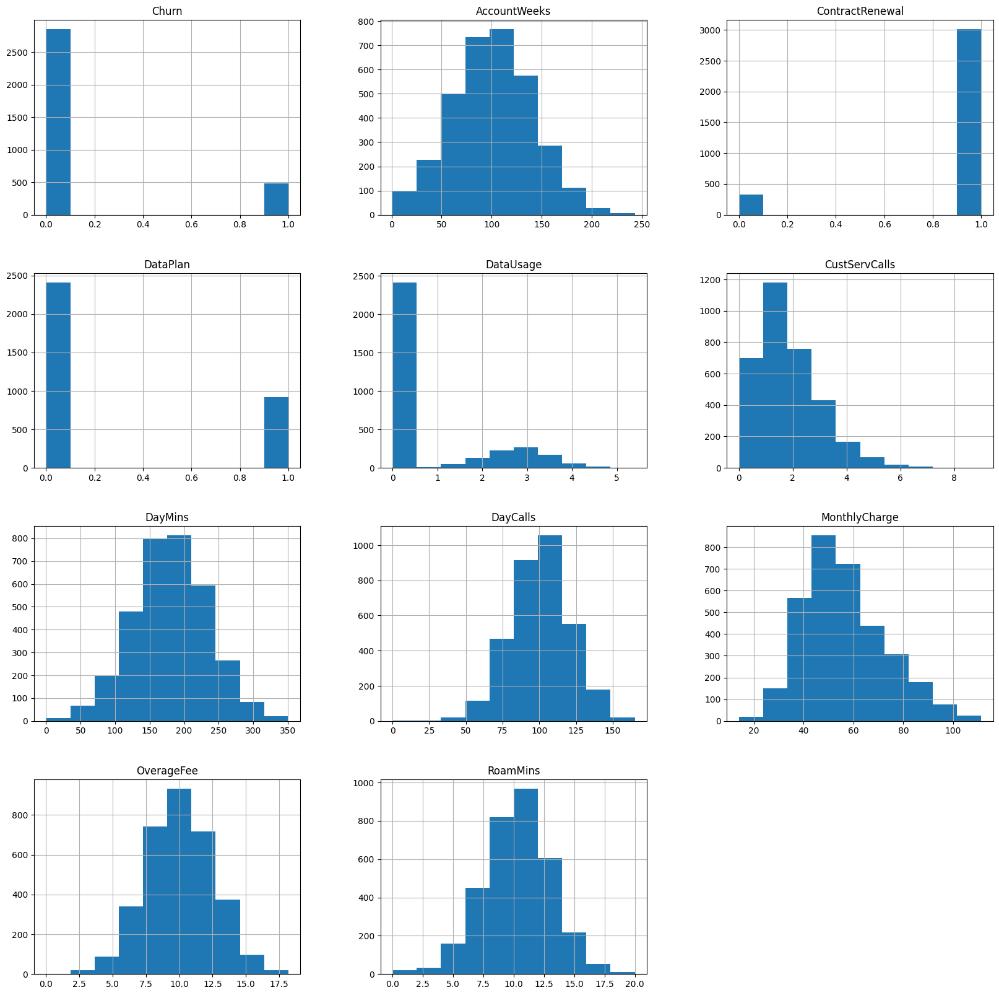

In [ ]:
df.hist(figsize=(20,20))
plt.show()

#### 1.4.1.3 Obserbamos los valores que se salen de los bigotes

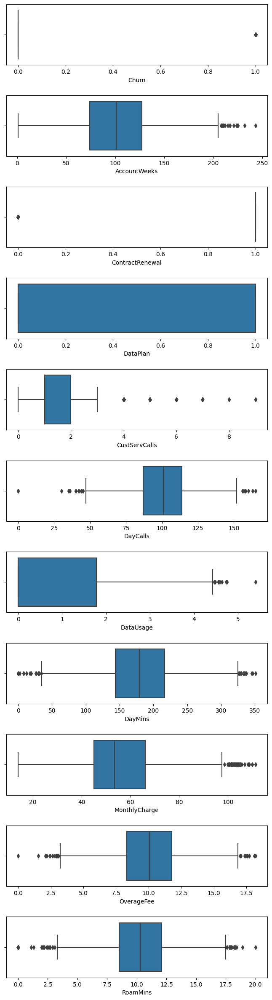

In [ ]:
diagramaCajaBigotes(df, numericas)

### 1.4.2 Eliminar registros absurdos 

In [ ]:
#df = df[df['columna']>=0]

### 1.4.3 Comprobar el tamaño del dataset después de los cambios

In [ ]:
df.shape

(3333, 12)

## 1.5 Errores tipográficos

In [ ]:
df.shape

(3333, 12)

### 1.5.1 Comprobar los diferentes valores

In [ ]:
#diagramaValoresDiferentes(df, categoricas)

### 1.5.3 Agrupar en un unico valor los valores que simbolicen lo mismo (pj. "unknown", "unk", "Unknown", "Unk", "UNKNOWN", "unknow")

Transformamos todo a minúsculas

In [ ]:
#transformarMinusculas(df, categoricas)
#diagramaValoresDiferentes(df, categoricas)

Remplazamos ciertos valores por un unico valor

In [ ]:
#print(df['columna'].unique())
#df['columna'] = df['columna'].str.replace('value|Valor|VALOR|vALOR', 'valor', regex=True)
#print(df['columna'].unique())

### 1.5.4 Comprobar el tamaño del dataset después de los cambios

In [ ]:
df.shape

(3333, 12)

## 1.6 Guardar y esportar el dataset resultante

In [ ]:
dfL = df.copy()

In [ ]:
nombre = 'limpio.csv'
dfL.to_csv(nombre, encoding = 'utf-8-sig') 
files.download(nombre)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Limpieza referencias:

[Codificando Bits](https://www.youtube.com/watch?v=bGnD1Ki7j-g&ab_channel=CodificandoBits)

# 2. Análisis exploratorio
2.1 Análisis de cada variable de manera individual

2.2 Análisis univariado: relación de cada variable con la variable a predecir

2.3 Análisis bivariado: relación de pare de variables predictoras con la variable a predecir

Eliminar filas que no vayamos a usar

## 2.1 Análisis de cada variable de manera individual

### 2.1.1 Variables categóricas

Separamos las variables categóricas:

In [ ]:
categoricas = []

Y miramos sus diferentes valores:

In [ ]:
#diagramaValoresDiferentes(df, categoricas)

**Observaciones**:

No hay categóricas

### 2.1.2 Variables numéricas

In [ ]:
df.describe()

,Churn,AccountWeeks,ContractRenewal,DataPlan,DataUsage,CustServCalls,DayMins,DayCalls,MonthlyCharge,OverageFee,RoamMins
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,0.144914,101.064806,0.903090,0.276628,0.816475,1.562856,179.775098,100.435644,56.305161,10.051488,10.237294
std,0.352067,39.822106,0.295879,0.447398,1.272668,1.315491,54.467389,20.069084,16.426032,2.535712,2.791840
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,0.000000,0.000000
25%,0.000000,74.000000,1.000000,0.000000,0.000000,1.000000,143.700000,87.000000,45.000000,8.330000,8.500000
50%,0.000000,101.000000,1.000000,0.000000,0.000000,1.000000,179.400000,101.000000,53.500000,10.070000,10.300000
75%,0.000000,127.000000,1.000000,1.000000,1.780000,2.000000,216.400000,114.000000,66.200000,11.770000,12.100000
max,1.000000,243.000000,1.000000,1.000000,5.400000,9.000000,350.800000,165.000000,111.300000,18.190000,20.000000


In [ ]:
numericas = ['Churn', 'AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls', 'DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']

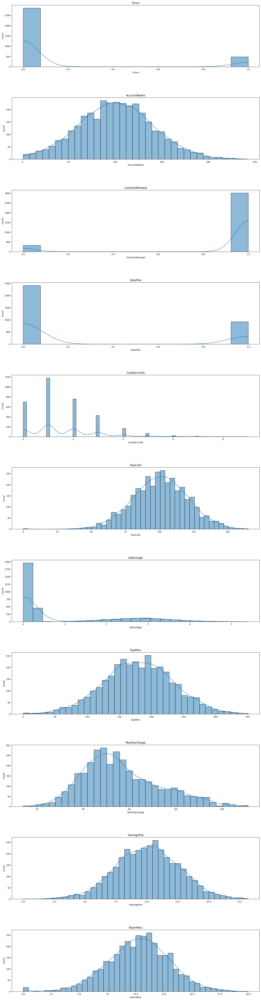

In [ ]:
histogramas(df, numericas)

**Observaciones**:

+ CustServCalls: Tiene una desviación hacia la izquierda (menos llamadas a atención al cliente)
+ DayCalls: Tiene una distribución normal ligeramente desviada a la derecha con centro en 100
+ DataUsage: Se diferencian dos grupos (consumo < 1 de muchas personan, una normal con mucha varianza con centro en 3)

## 2.2 Análisis univariado: relación de cada variable con la variable a predecir

### 2.2.1 Transformar a numericas las variables a predecir

In [ ]:
'''
diccionario = {'yes':1, 'no':0} #crear un diccionario para sustituir los strings
binario = df['Churn'].map(diccionario) #generar una columna aplicando el diccionario a la columna 'Churn'
df['Churn_bin'] = binario #añadimos la columna al datframe
'''

"\ndiccionario = {'yes':1, 'no':0} #crear un diccionario para sustituir los strings\nbinario = df['Churn'].map(diccionario) #generar una columna aplicando el diccionario a la columna 'Churn'\ndf['Churn_bin'] = binario #añadimos la columna al datframe\n"

### 2.2.2 Analizar relaciones entre las variables númericas y la variable a predecir

#### Miramos la correlación de las variables

Text(0.5, 1.0, 'Matriz de Correlación')


Text(0.5, 1.0, 'Matriz de Correlación')

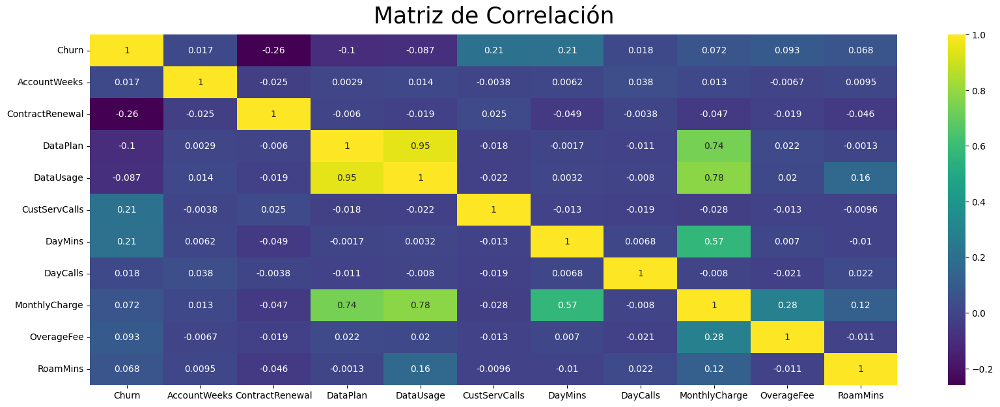

In [ ]:
matrizCorrelacion(df, True)

#### Por cada columna diferente a la que queremos predecir graficamos una realación para poder crear grupos

In [ ]:
numm = numericas
numm.remove('Churn')
print(numm)

['AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls', 'DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']


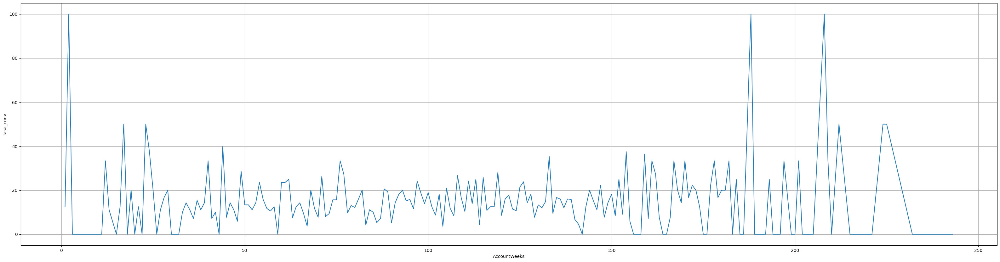

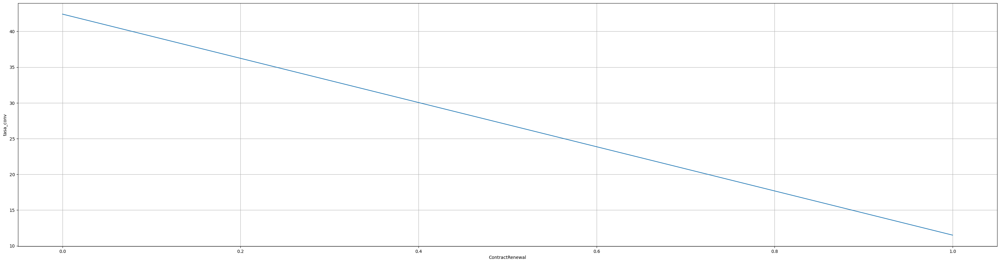

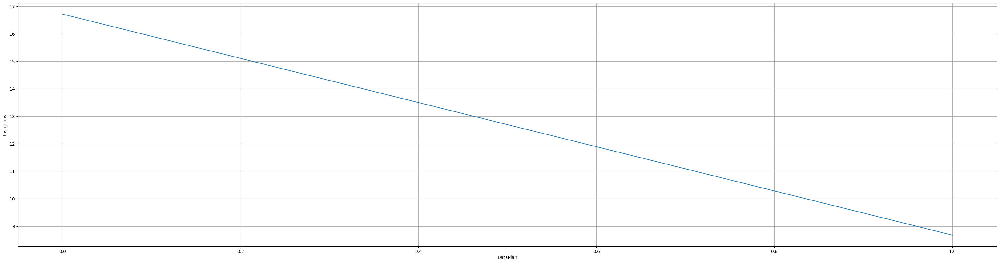

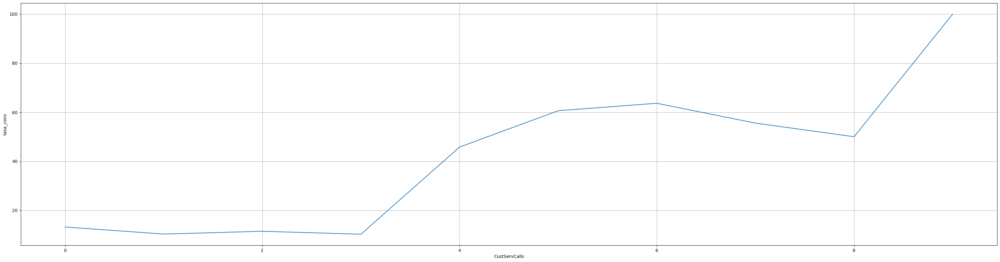

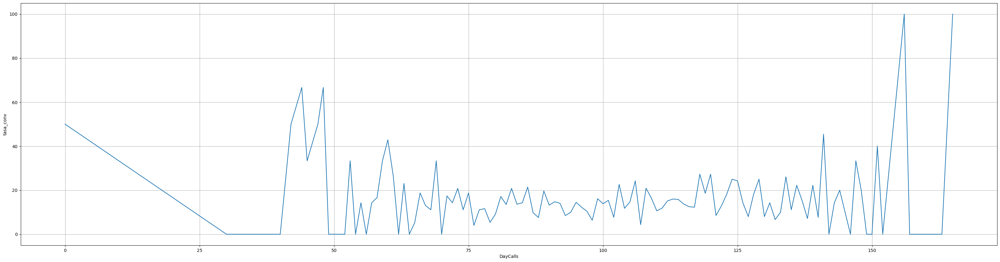

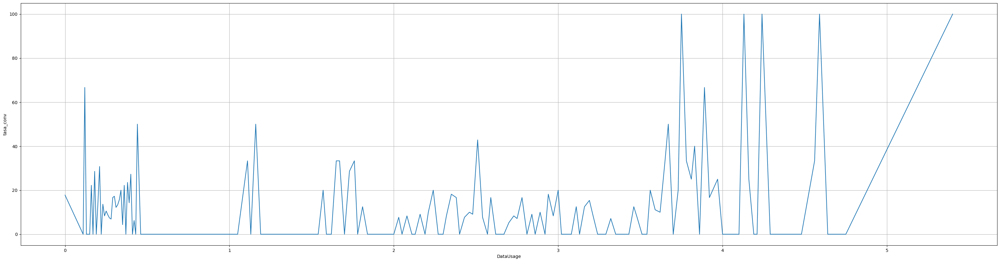

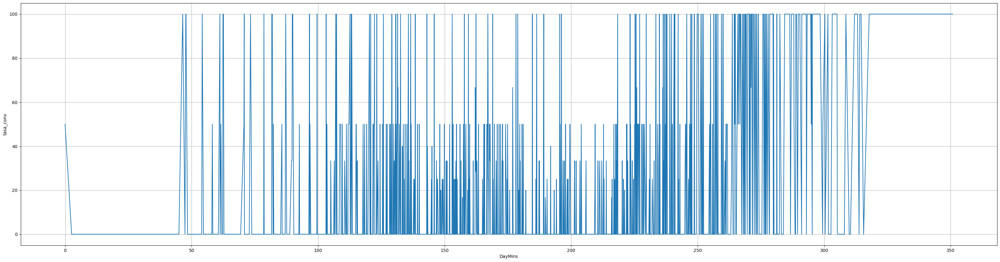

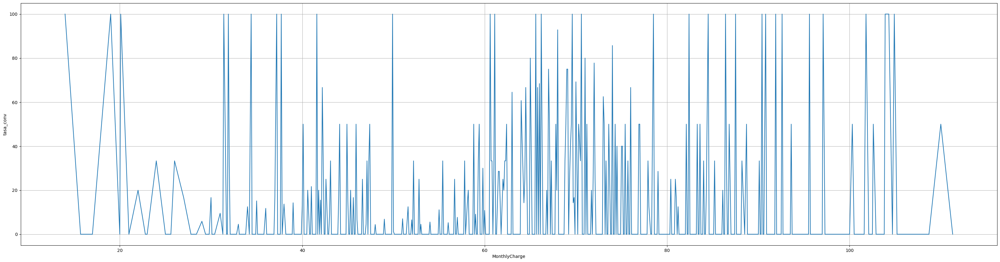

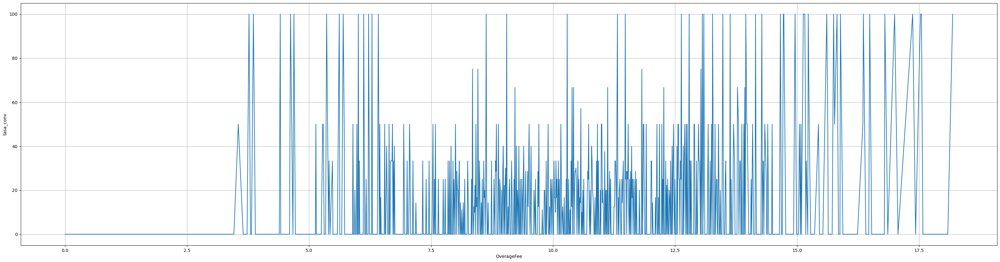

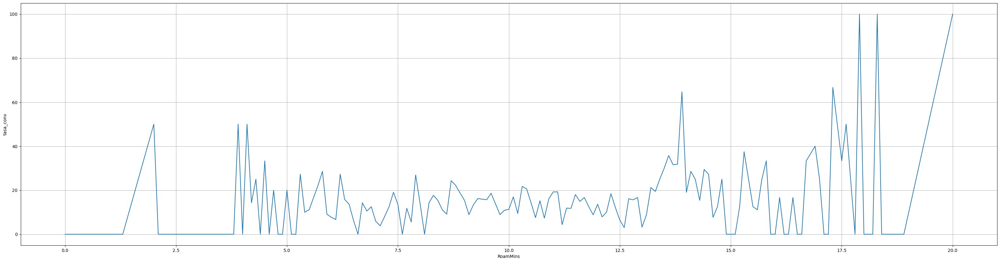

In [ ]:
for columna in numm:
  graficarTasasConversion(dfN=df, varPredecir='Churn', varPredicctora=columna)

#### Intentamos crear grupos según las gráficas que hemos visto

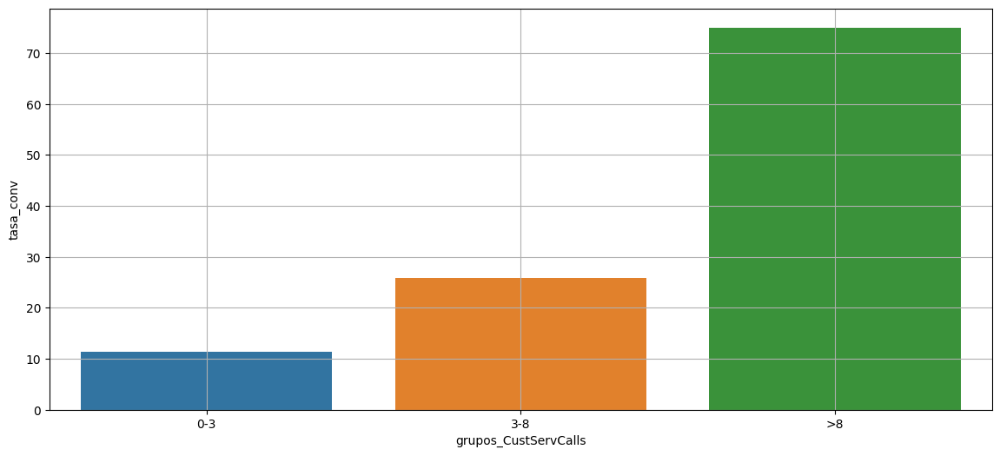

In [ ]:
df.loc[:, 'grupos_CustServCalls'] = '<0'
df.loc[(df['CustServCalls']>=0) & (df['CustServCalls']<3), 'grupos_CustServCalls'] = '0-3'
df.loc[(df['CustServCalls']>=3) & (df['CustServCalls']<8), 'grupos_CustServCalls'] = '3-8'
df.loc[(df['CustServCalls']>=8), 'grupos_CustServCalls'] = '>8'

graficarTasasConversion(dfN=df, varPredecir='Churn', varPredicctora='grupos_CustServCalls', type='bar')

#### Mostramos las mismas relaciones pero con un gráfico de puntos

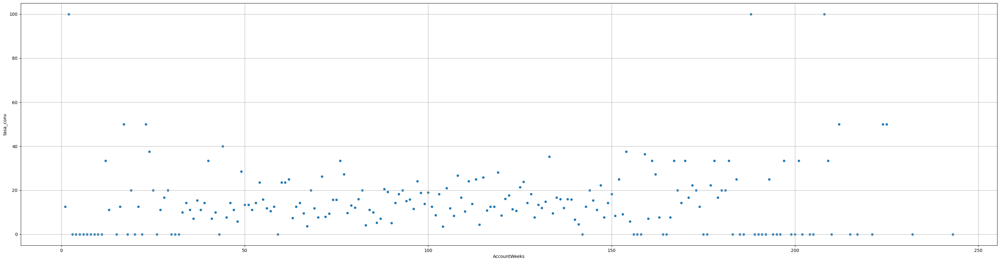

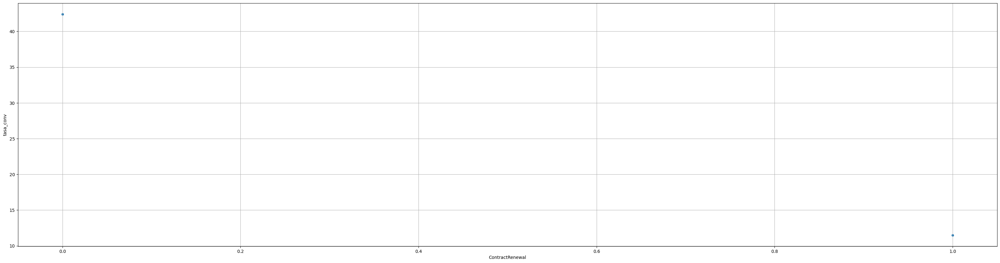

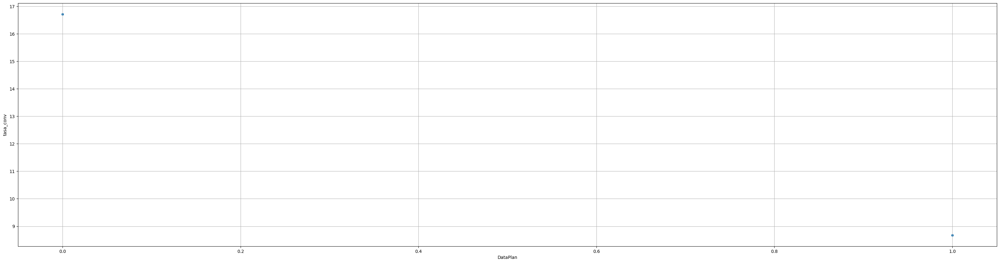

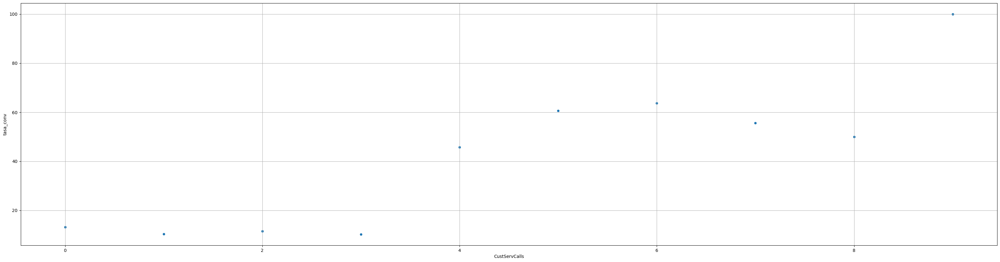

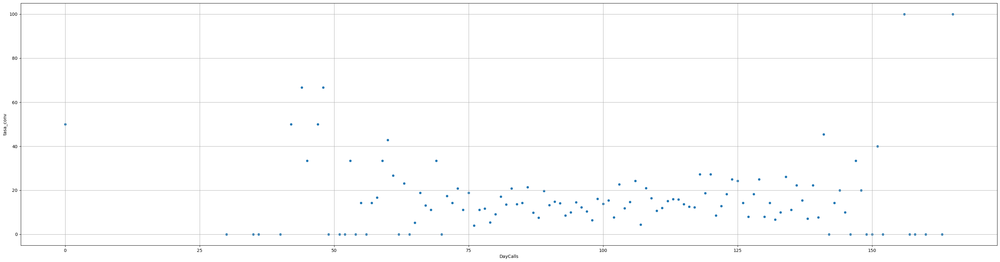

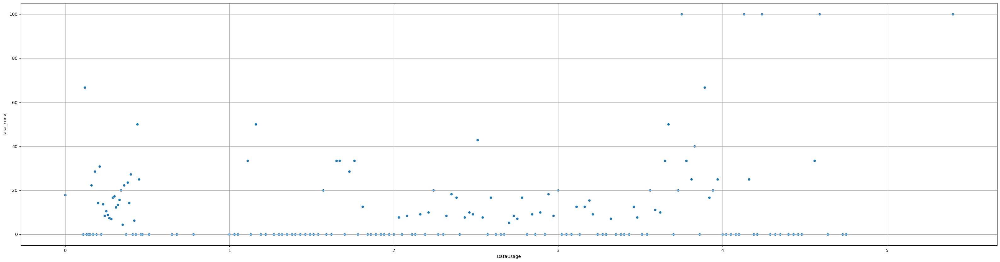

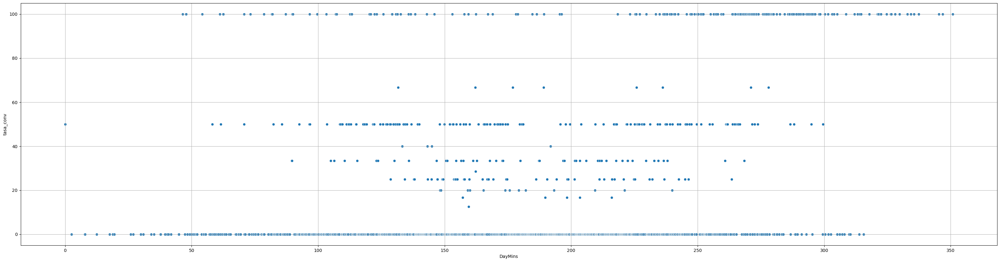

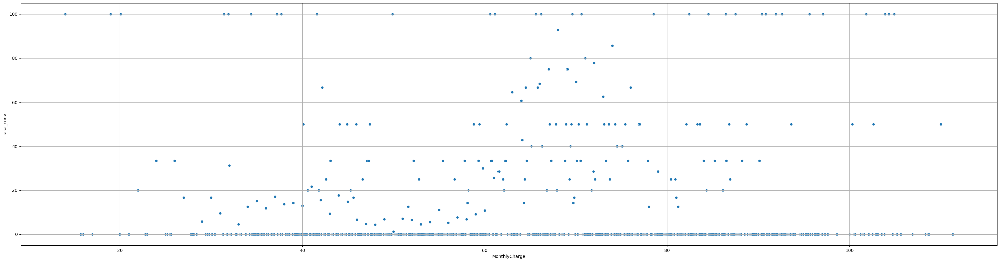

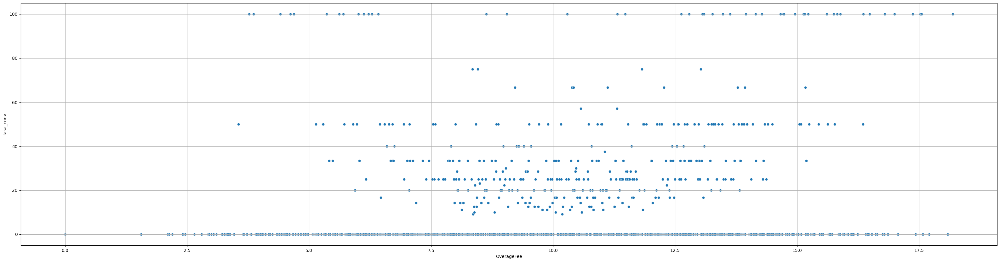

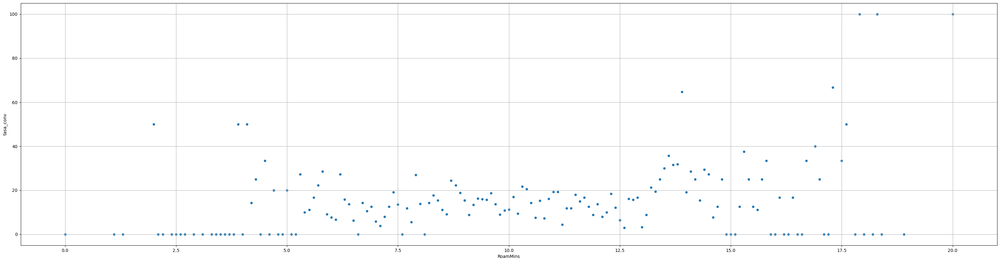

In [ ]:
for columna in numm:
  graficarTasasConversion(dfN=df, varPredecir='Churn', varPredicctora=columna, type='scatter')

Intentamos crear algún otro grupo

## 2.3 Análisis bivariado: relación de par de variables predictoras con la variable a predecir

In [ ]:
#graficar_tc_bivariada(dfN=df, varPredecir='Churn', listaPredictora2=['MonthlyCharge', 'DayMins'])

Error in callback <function _draw_all_if_interactive at 0x7fd7bed6d000> (for post_execute):


KeyboardInterrupt: ignored

# 3 Modelos

## 3.1 Comprobar si los datos están devalanceados

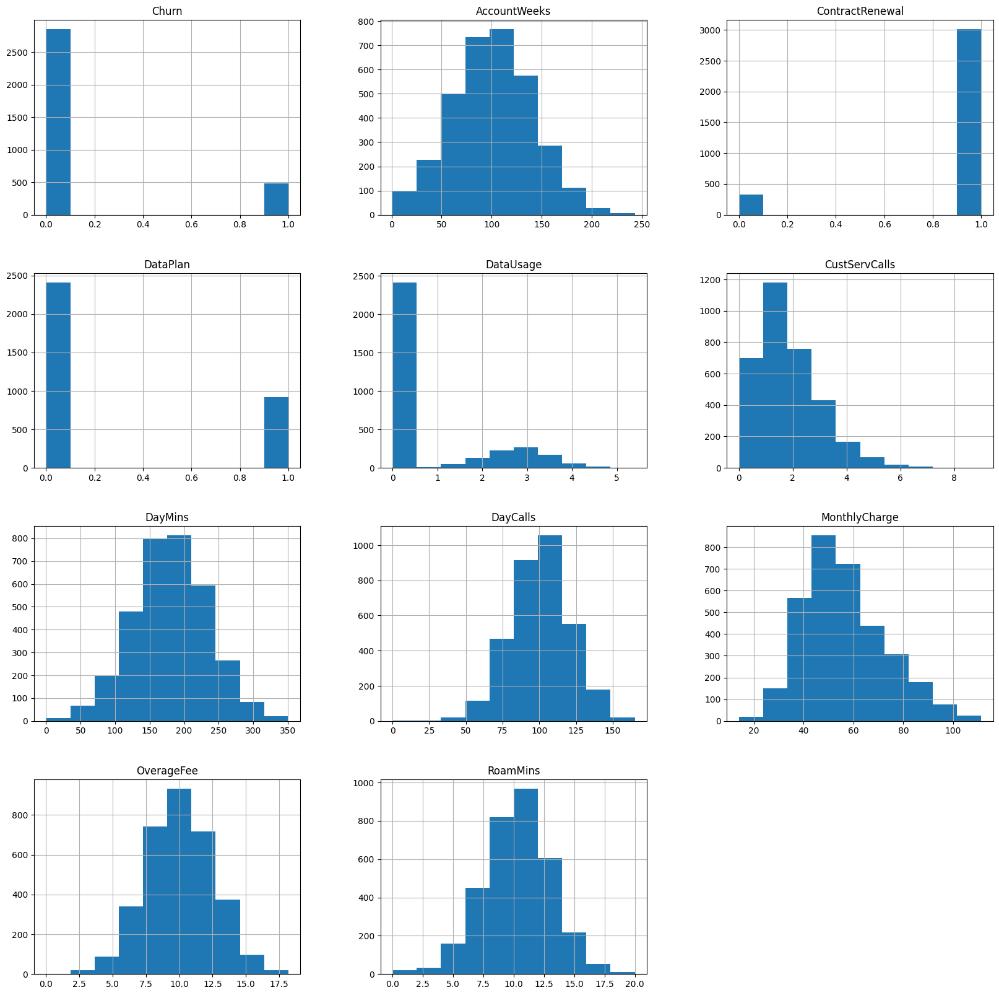

In [ ]:
df.hist(figsize=(20,20))
plt.show()

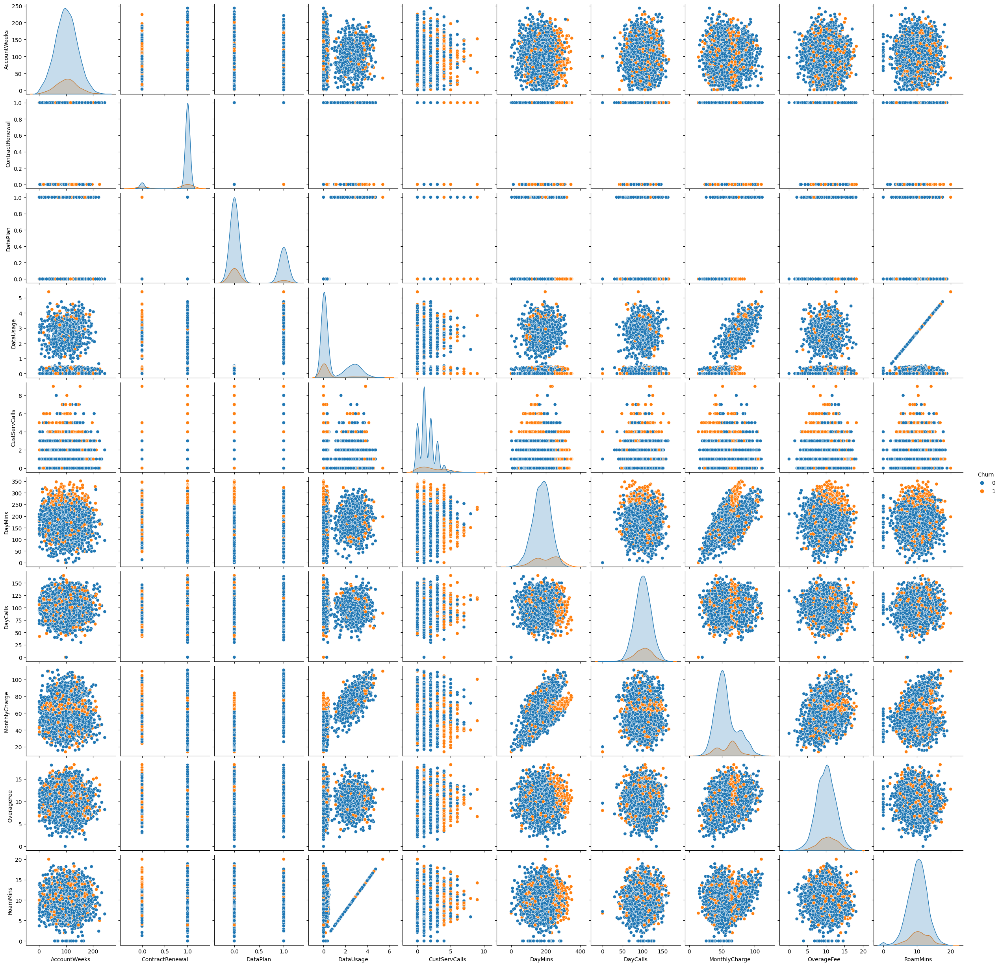

In [ ]:
sns.pairplot(df, hue='Churn')

## 3.2 Balancear los datos pt1 under sampling

In [ ]:
dfV = valancear_datos_under_sampling(dfN=df, columna_predecir='Churn')
print(dfV['Churn'].value_counts())

0    2850
1     483
Name: Churn, dtype: int64
0    483
1    483
Name: Churn, dtype: int64


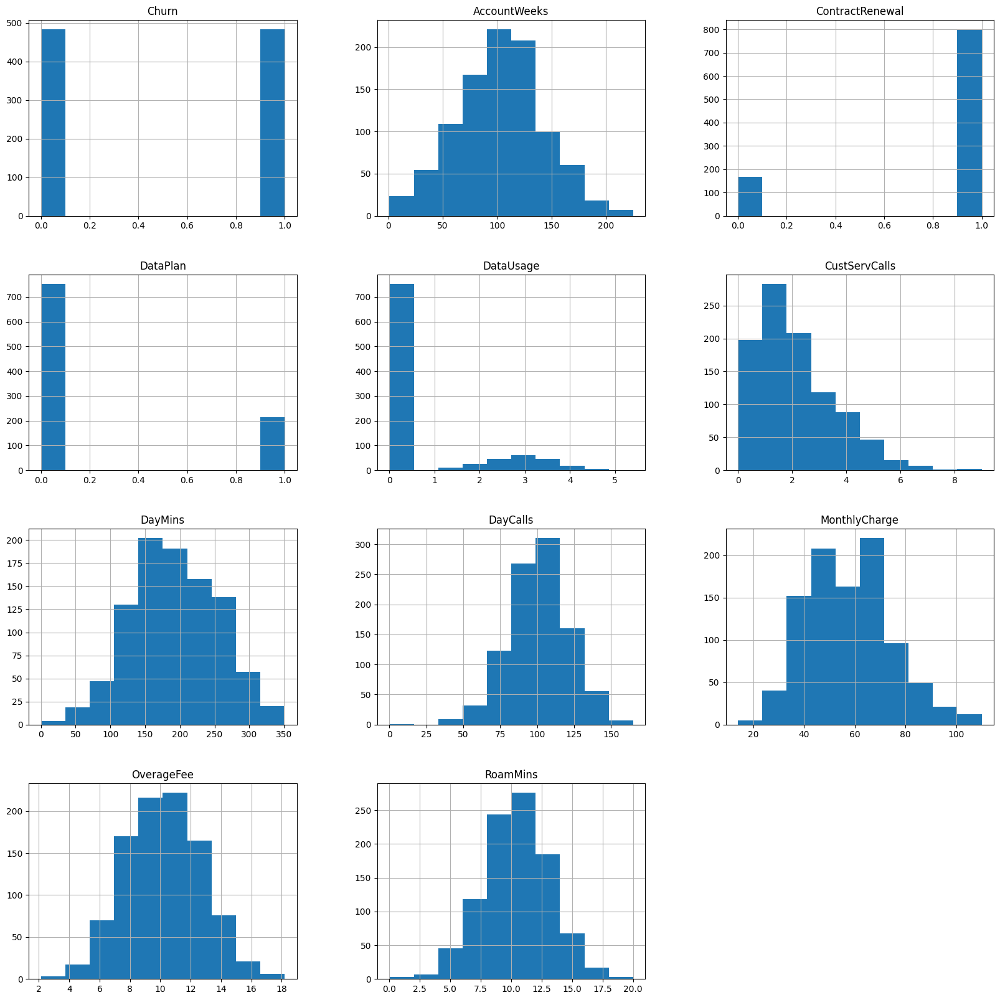

In [ ]:
dfV.hist(figsize=(20,20))
plt.show()

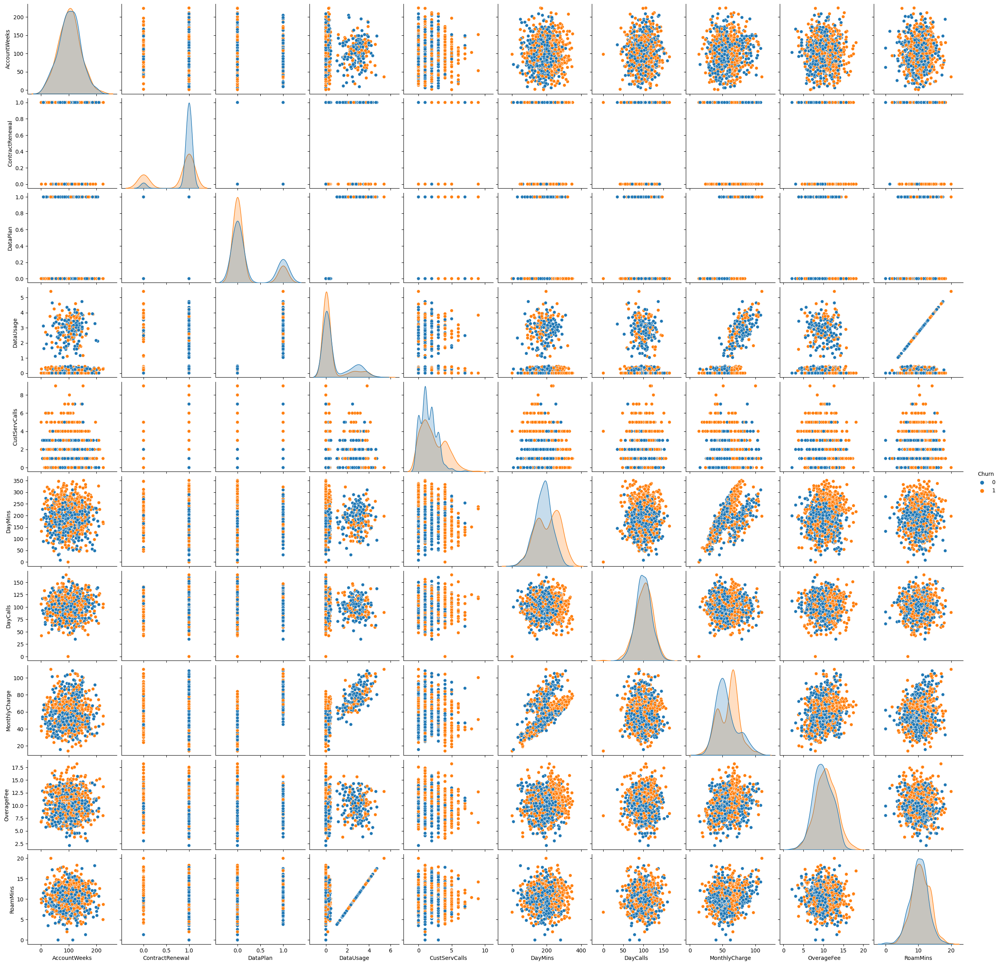

In [ ]:
sns.pairplot(dfV, hue='Churn')

## 3.3 Probar modelos

In [ ]:
numm = ['AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls', 'DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']

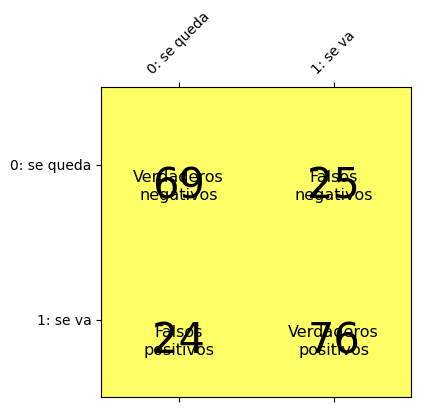

Matriz de confusion
[[69 24]
 [25 76]]
Precision del modelo
0.7474226804123711
Exactitud del modelo
0.7474226804123711
Sensibilidad del modelo
0.7474226804123711
Puntaje F1 del modelo
0.7474226804123713
Curva ROC-AUC del modelo
0.7472053656978601


In [ ]:
X_train, X_test, y_train, y_test = loadDatasetML(dfV, numm, 'Churn')

algoritmo = SVC(kernel= 'linear')

algoritmo.fit(X_train, y_train)

y_pred, matriz, precision = predTest(algoritmo, X_test, y_test)

In [ ]:
modelos = [ [SVC(kernel= 'linear', class_weight='balanced'), 'SVC'],
           [DecisionTreeClassifier(criterion = 'entropy', class_weight='balanced'), 'DecisionTreeClassifier'],
           [KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2), 'KNeighborsClassifier'],
           [RandomForestClassifier(n_estimators = 10, criterion = 'entropy', class_weight='balanced'), 'RandomForestClassifier'],
           [XGBClassifier(class_weight='balanced'), 'XGBClassifier'],
           [GaussianNB(), 'GaussianNB']]

-----------------------------------SVC---------------------------------------


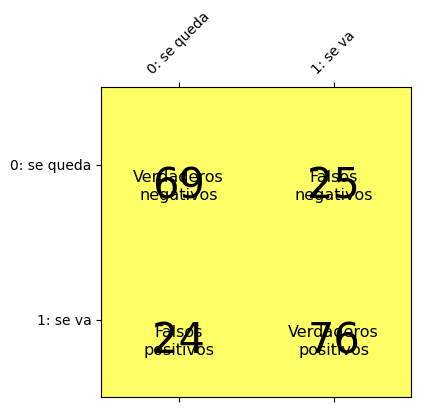

Matriz de confusion
[[69 24]
 [25 76]]
Precision del modelo
0.7474226804123711
Exactitud del modelo
0.7474226804123711
Sensibilidad del modelo
0.7474226804123711
Puntaje F1 del modelo
0.7474226804123713
Curva ROC-AUC del modelo
0.7472053656978601
-----------------------------------DecisionTreeClassifier---------------------------------------


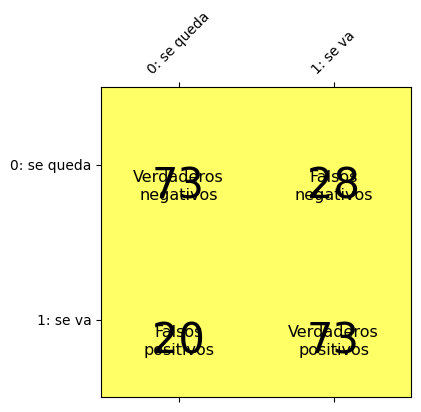

Matriz de confusion
[[73 20]
 [28 73]]
Precision del modelo
0.7525773195876289
Exactitud del modelo
0.7525773195876289
Sensibilidad del modelo
0.7525773195876289
Puntaje F1 del modelo
0.752577319587629
Curva ROC-AUC del modelo
0.7538592568934313
-----------------------------------KNeighborsClassifier---------------------------------------


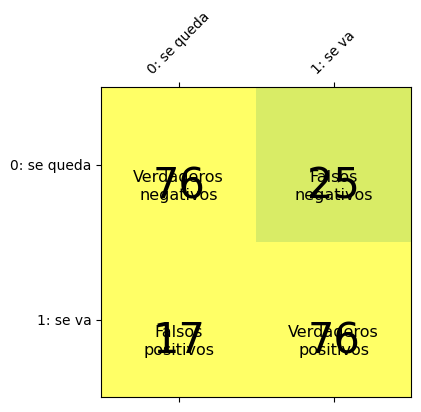

Matriz de confusion
[[76 17]
 [25 76]]
Precision del modelo
0.7835051546391752
Exactitud del modelo
0.7835051546391752
Sensibilidad del modelo
0.7835051546391752
Puntaje F1 del modelo
0.7835051546391752
Curva ROC-AUC del modelo
0.7848397743000105
-----------------------------------RandomForestClassifier---------------------------------------


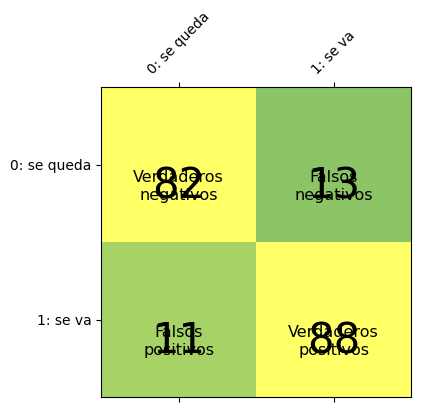

Matriz de confusion
[[82 11]
 [13 88]]
Precision del modelo
0.8762886597938144
Exactitud del modelo
0.8762886597938144
Sensibilidad del modelo
0.8762886597938144
Puntaje F1 del modelo
0.8762886597938144
Curva ROC-AUC del modelo
0.8765037794101991
-----------------------------------XGBClassifier---------------------------------------
[21:47:31] WARNING: ../src/learner.cc:767: 
Parameters: { "class_weight" } are not used.



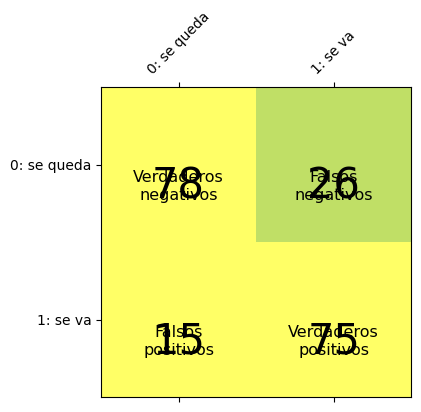

Matriz de confusion
[[78 15]
 [26 75]]
Precision del modelo
0.788659793814433
Exactitud del modelo
0.788659793814433
Sensibilidad del modelo
0.788659793814433
Puntaje F1 del modelo
0.788659793814433
Curva ROC-AUC del modelo
0.7906419674225488
-----------------------------------GaussianNB---------------------------------------


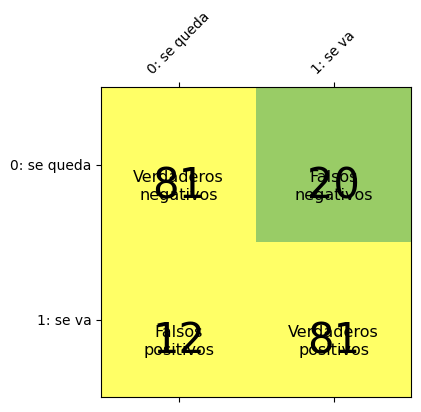

Matriz de confusion
[[81 12]
 [20 81]]
Precision del modelo
0.8350515463917526
Exactitud del modelo
0.8350515463917526
Sensibilidad del modelo
0.8350515463917526
Puntaje F1 del modelo
0.8350515463917526
Curva ROC-AUC del modelo
0.8364739699776429


In [ ]:
for modelo in modelos:
  print(f'-----------------------------------{modelo[1]}---------------------------------------')
  X_train, X_test, y_train, y_test = loadDatasetML(dfV, numm, 'Churn')
  modelo[0].fit(X_train, y_train)
  y_pred, matriz, precision = predTest(modelo[0], X_test, y_test)

## 3.4 Usamos los modelos con todo el dataset

-----------------------------------SVC---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


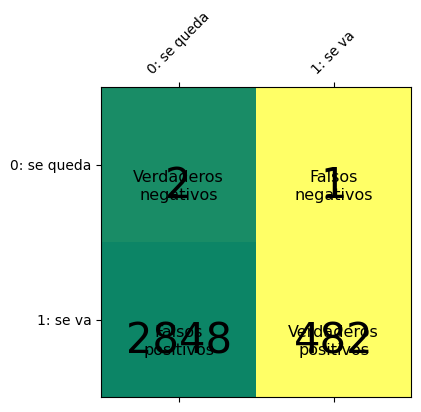

Matriz de confusion
[[   2 2848]
 [   1  482]]
Precision del modelo
0.14521452145214522
Exactitud del modelo
0.14521452145214522
Sensibilidad del modelo
0.14521452145214522
Puntaje F1 del modelo
0.14521452145214522
Curva ROC-AUC del modelo
0.4993156805056118
-----------------------------------DecisionTreeClassifier---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


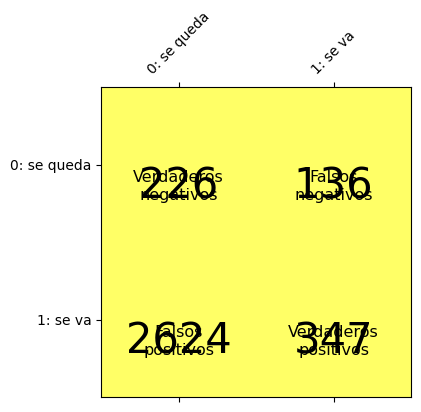

Matriz de confusion
[[ 226 2624]
 [ 136  347]]
Precision del modelo
0.1719171917191719
Exactitud del modelo
0.1719171917191719
Sensibilidad del modelo
0.1719171917191719
Puntaje F1 del modelo
0.1719171917191719
Curva ROC-AUC del modelo
0.3988623733246159
-----------------------------------KNeighborsClassifier---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


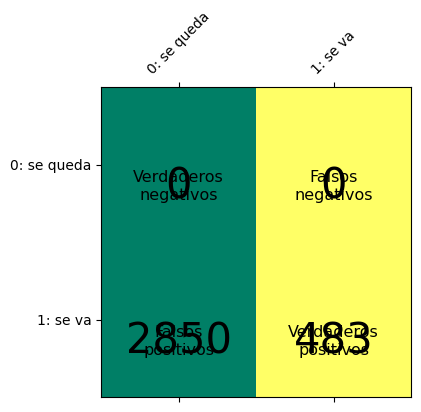

Matriz de confusion
[[   0 2850]
 [   0  483]]
Precision del modelo
0.14491449144914492
Exactitud del modelo
0.14491449144914492
Sensibilidad del modelo
0.14491449144914492
Puntaje F1 del modelo
0.14491449144914492
Curva ROC-AUC del modelo
0.5
-----------------------------------RandomForestClassifier---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


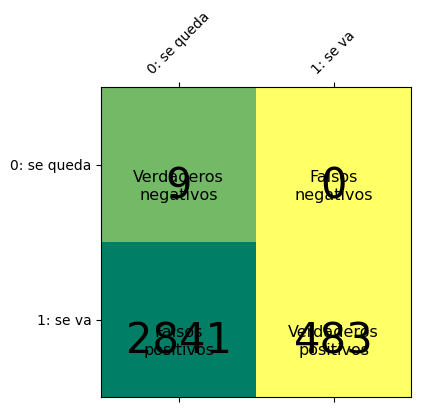

Matriz de confusion
[[   9 2841]
 [   0  483]]
Precision del modelo
0.1476147614761476
Exactitud del modelo
0.1476147614761476
Sensibilidad del modelo
0.1476147614761476
Puntaje F1 del modelo
0.1476147614761476
Curva ROC-AUC del modelo
0.5015789473684211
-----------------------------------XGBClassifier---------------------------------------


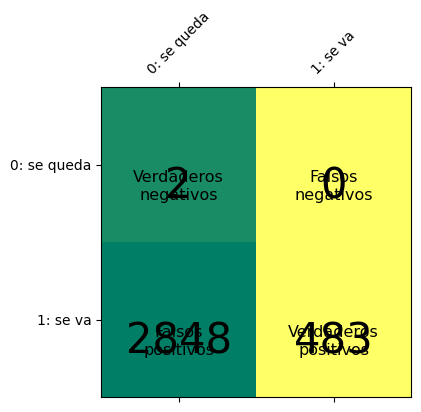

Matriz de confusion
[[   2 2848]
 [   0  483]]
Precision del modelo
0.14551455145514552
Exactitud del modelo
0.14551455145514552
Sensibilidad del modelo
0.14551455145514552
Puntaje F1 del modelo
0.14551455145514552
Curva ROC-AUC del modelo
0.5003508771929824
-----------------------------------GaussianNB---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but GaussianNB was fitted without feature names
  warnings.warn(


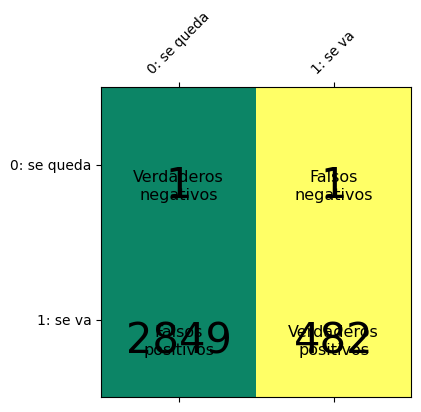

Matriz de confusion
[[   1 2849]
 [   1  482]]
Precision del modelo
0.14491449144914492
Exactitud del modelo
0.14491449144914492
Sensibilidad del modelo
0.14491449144914492
Puntaje F1 del modelo
0.14491449144914492
Curva ROC-AUC del modelo
0.4991402419091206


In [ ]:
entrada = df[numm]
salida = df['Churn']

for modelo in modelos:
  print(f'-----------------------------------{modelo[1]}---------------------------------------')
  y_pred, matriz, precision = predTest(modelo[0], entrada, salida)

## 3.5 Balanceo de datos

### Imports

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
# Comprobar que solo haya columnas numericas
#df = df.drop('id', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Churn            3333 non-null   int64  
 1   AccountWeeks     3333 non-null   int64  
 2   ContractRenewal  3333 non-null   int64  
 3   DataPlan         3333 non-null   int64  
 4   DataUsage        3333 non-null   float64
 5   CustServCalls    3333 non-null   int64  
 6   DayMins          3333 non-null   float64
 7   DayCalls         3333 non-null   int64  
 8   MonthlyCharge    3333 non-null   float64
 9   OverageFee       3333 non-null   float64
 10  RoamMins         3333 non-null   float64
dtypes: float64(5), int64(6)
memory usage: 286.6 KB


In [ ]:
df_sinChurn = df.drop('Churn', axis=1)
contarValoresDiferentes(df_sinChurn)

AccountWeeks :  212
ContractRenewal :  2
DataPlan :  2
DataUsage :  174
CustServCalls :  10
DayMins :  1667
DayCalls :  119
MonthlyCharge :  627
OverageFee :  1024
RoamMins :  162


In [ ]:
df_soloChurn = df[['Churn']]
contarValoresDiferentes(df_soloChurn)

Churn :  2


In [ ]:
sm = SMOTE(random_state=0)

X_sm, y_sm = sm.fit_resample(df_sinChurn, df_soloChurn)

print("X antes: ", df_sinChurn.shape)
print("X despues: ", X_sm.shape)

print("Valance de valores: ", y_sm.value_counts(normalize=True)*100)

X antes:  (3333, 10)
X despues:  (5700, 10)
Valance de valores:  Churn
0        50.0
1        50.0
dtype: float64


### Separar en entrenamiento y test

-----------------------------------SVC---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


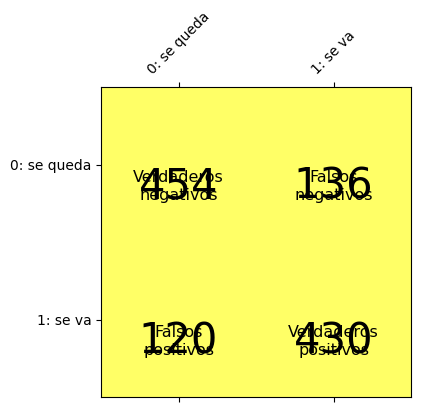

Matriz de confusion
[[454 120]
 [136 430]]
Precision del modelo
0.775438596491228
Exactitud del modelo
0.775438596491228
Sensibilidad del modelo
0.775438596491228
Puntaje F1 del modelo
0.7754385964912279
Curva ROC-AUC del modelo
0.7753290405190776
-----------------------------------DecisionTreeClassifier---------------------------------------


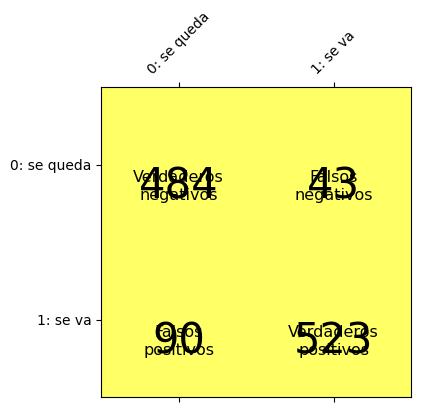

Matriz de confusion
[[484  90]
 [ 43 523]]
Precision del modelo
0.8833333333333333
Exactitud del modelo
0.8833333333333333
Sensibilidad del modelo
0.8833333333333333
Puntaje F1 del modelo
0.8833333333333333
Curva ROC-AUC del modelo
0.8836169217320643
-----------------------------------KNeighborsClassifier---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


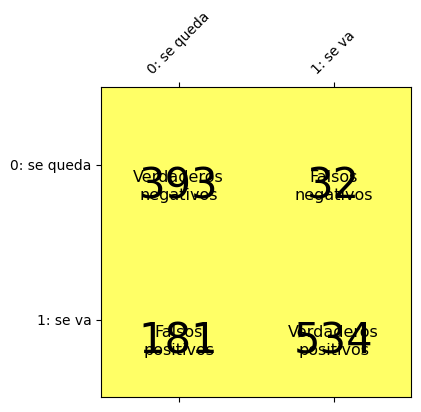

Matriz de confusion
[[393 181]
 [ 32 534]]
Precision del modelo
0.8131578947368421
Exactitud del modelo
0.8131578947368421
Sensibilidad del modelo
0.8131578947368421
Puntaje F1 del modelo
0.8131578947368422
Curva ROC-AUC del modelo
0.8140659435367701
-----------------------------------RandomForestClassifier---------------------------------------


<ipython-input-14-ec647d11a981>:11: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  modelo[0].fit(X_train, y_train)


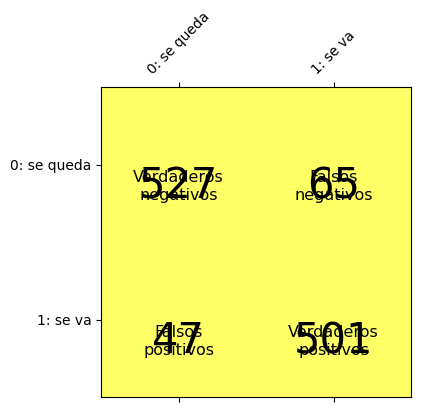

Matriz de confusion
[[527  47]
 [ 65 501]]
Precision del modelo
0.9017543859649123
Exactitud del modelo
0.9017543859649123
Sensibilidad del modelo
0.9017543859649123
Puntaje F1 del modelo
0.9017543859649123
Curva ROC-AUC del modelo
0.9016387387498307
-----------------------------------XGBClassifier---------------------------------------
[15:32:41] WARNING: ../src/learner.cc:767: 
Parameters: { "class_weight" } are not used.



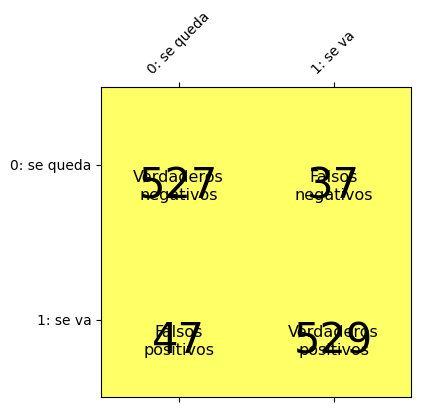

Matriz de confusion
[[527  47]
 [ 37 529]]
Precision del modelo
0.9263157894736842
Exactitud del modelo
0.9263157894736842
Sensibilidad del modelo
0.9263157894736842
Puntaje F1 del modelo
0.9263157894736842
Curva ROC-AUC del modelo
0.9263737210819861
-----------------------------------GaussianNB---------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


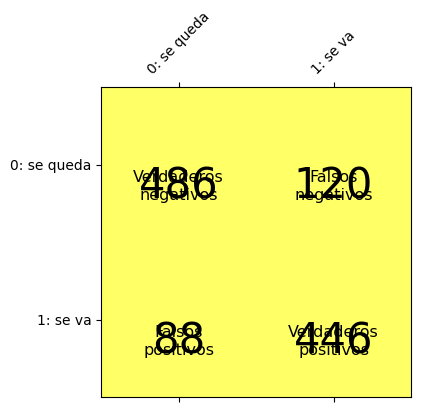

Matriz de confusion
[[486  88]
 [120 446]]
Precision del modelo
0.8175438596491228
Exactitud del modelo
0.8175438596491228
Sensibilidad del modelo
0.8175438596491228
Puntaje F1 del modelo
0.8175438596491228
Curva ROC-AUC del modelo
0.8173378805973824


In [ ]:
numm = ['AccountWeeks', 'ContractRenewal', 'DataPlan', 'CustServCalls', 'DayCalls', 'DataUsage', 'DayMins', 'MonthlyCharge', 'OverageFee', 'RoamMins']
modelos = [ [SVC(kernel= 'linear', class_weight='balanced'), 'SVC'],
           [DecisionTreeClassifier(criterion = 'entropy', class_weight='balanced'), 'DecisionTreeClassifier'],
           [KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2), 'KNeighborsClassifier'],
           [RandomForestClassifier(n_estimators = 10, criterion = 'entropy', class_weight='balanced'), 'RandomForestClassifier'],
           [XGBClassifier(class_weight='balanced'), 'XGBClassifier'],
           [GaussianNB(), 'GaussianNB']]
for modelo in modelos:
  print(f'-----------------------------------{modelo[1]}---------------------------------------')
  X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=1)
  modelo[0].fit(X_train, y_train)
  y_pred, matriz, precision = predTest(modelo[0], X_test, y_test)

### Usamos el modelo con el data set real

In [ ]:
entrada = df.drop('Churn', axis=1)
entrada.columns

Index(['AccountWeeks', 'ContractRenewal', 'DataPlan', 'DataUsage',
       'CustServCalls', 'DayMins', 'DayCalls', 'MonthlyCharge', 'OverageFee',
       'RoamMins'],
      dtype='object')

In [ ]:
salida = df[['Churn']]
salida.columns

Index(['Churn'], dtype='object')

-----------------------------------SVC---------------------------------------


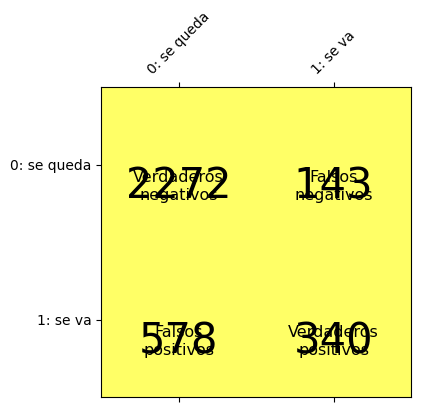

Matriz de confusion
[[2272  578]
 [ 143  340]]
Precision del modelo
0.7836783678367837
Exactitud del modelo
0.7836783678367837
Sensibilidad del modelo
0.7836783678367837
Puntaje F1 del modelo
0.7836783678367837
Curva ROC-AUC del modelo
0.7505633649340744
-----------------------------------DecisionTreeClassifier---------------------------------------


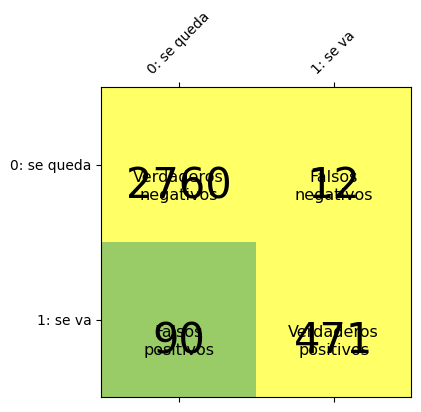

Matriz de confusion
[[2760   90]
 [  12  471]]
Precision del modelo
0.9693969396939695
Exactitud del modelo
0.9693969396939695
Sensibilidad del modelo
0.9693969396939695
Puntaje F1 del modelo
0.9693969396939695
Curva ROC-AUC del modelo
0.9717881660673423
-----------------------------------KNeighborsClassifier---------------------------------------


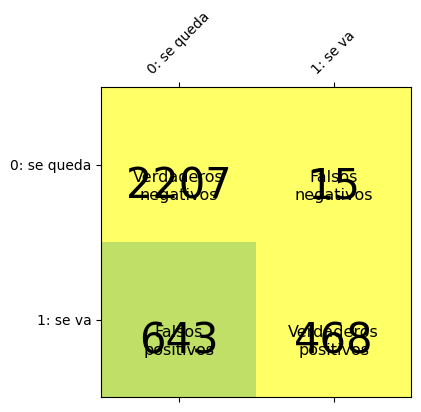

Matriz de confusion
[[2207  643]
 [  15  468]]
Precision del modelo
0.8025802580258026
Exactitud del modelo
0.8025802580258026
Sensibilidad del modelo
0.8025802580258026
Puntaje F1 del modelo
0.8025802580258026
Curva ROC-AUC del modelo
0.8716650321455814
-----------------------------------RandomForestClassifier---------------------------------------


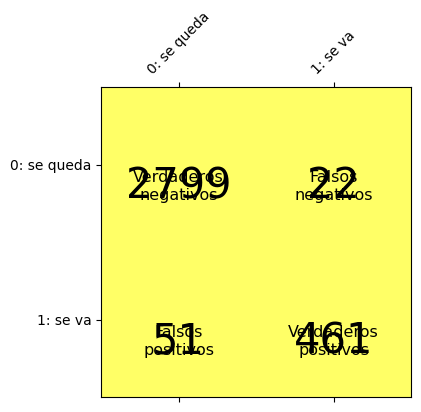

Matriz de confusion
[[2799   51]
 [  22  461]]
Precision del modelo
0.978097809780978
Exactitud del modelo
0.978097809780978
Sensibilidad del modelo
0.978097809780978
Puntaje F1 del modelo
0.978097809780978
Curva ROC-AUC del modelo
0.9682783044567942
-----------------------------------XGBClassifier---------------------------------------


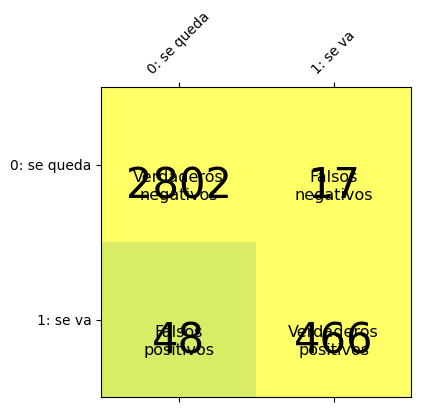

Matriz de confusion
[[2802   48]
 [  17  466]]
Precision del modelo
0.9804980498049805
Exactitud del modelo
0.9804980498049805
Sensibilidad del modelo
0.9804980498049805
Puntaje F1 del modelo
0.9804980498049805
Curva ROC-AUC del modelo
0.9739806036831209
-----------------------------------GaussianNB---------------------------------------


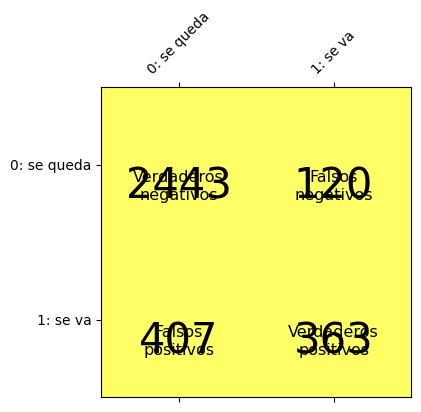

Matriz de confusion
[[2443  407]
 [ 120  363]]
Precision del modelo
0.8418841884188419
Exactitud del modelo
0.8418841884188419
Sensibilidad del modelo
0.8418841884188419
Puntaje F1 del modelo
0.8418841884188419
Curva ROC-AUC del modelo
0.8043728887435981


In [ ]:
for modelo in modelos:
  print(f'-----------------------------------{modelo[1]}---------------------------------------')
  y_pred, matriz, precision = predTest(modelo[0], entrada, salida)

## 3.6 Guardar el modelo entrenado

In [ ]:
import joblib

In [ ]:
joblib.dump(modelos[1][0], "modelo_DecisionTreeClassifier.pkl")

['modelo_DecisionTreeClassifier.pkl']

In [ ]:
joblib.dump(modelos[4][0], "modelo_XGBClassifier.pkl")

['modelo_XGBClassifier.pkl']

### Información de apoyo
https://youtu.be/CpVVrak2YfI

# 4 Interpretabiidad

4.1 Importar el modelo entrenado

In [ ]:
import joblib

In [ ]:
clf = joblib.load('modelo_XGBClassifier.pkl')

## 4.2 Métodos de interpretacion

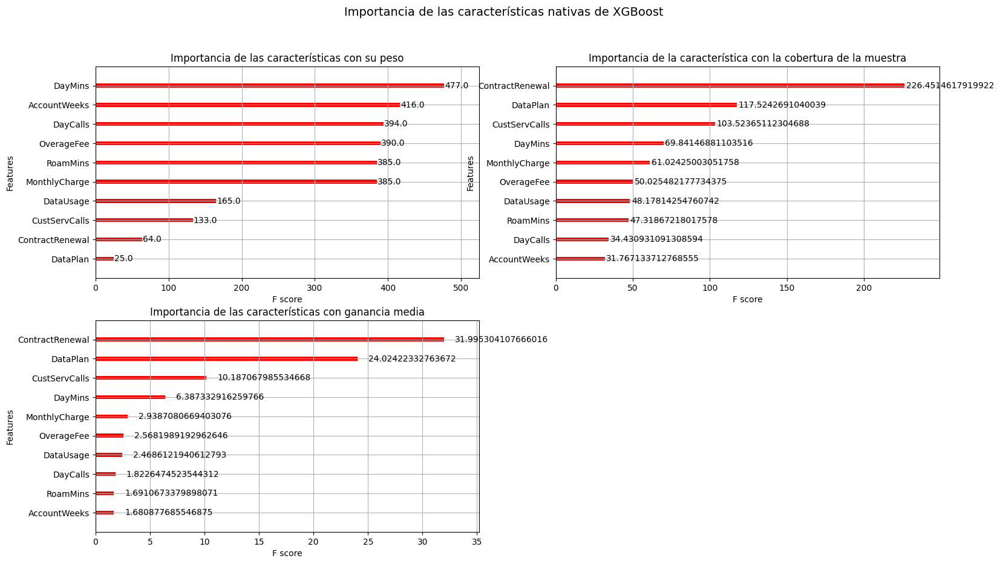

In [ ]:
### Modelos
from xgboost import XGBClassifier, plot_importance

# Trazando la importancia de las características de XGBoost
fig = plt.figure(figsize = (18, 10))
title = fig.suptitle("Importancia de las características nativas de XGBoost", fontsize=14)

ax1 = fig.add_subplot(2, 2, 1)
plot_importance(clf, importance_type='weight', ax=ax1, color='red')
ax1.set_title("Importancia de las características con su peso");

ax2 = fig.add_subplot(2, 2, 2)
plot_importance(clf, importance_type='cover', ax=ax2, color='red')
ax2.set_title("Importancia de la característica con la cobertura de la muestra");

ax3 = fig.add_subplot(2, 2, 3)
plot_importance(clf, importance_type='gain', ax=ax3, color='red')
ax3.set_title("Importancia de las características con ganancia media");

### 4.2.1 ELI5 Model Interpretation

In [ ]:
#!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107730 sha256=720b421881942de03a10377f5d37801d38c280d3202c1dcf3fd65c2b40899be6
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
eli5.show_weights(clf.get_booster())

Weight,Feature
0.3731,ContractRenewal
0.2801,DataPlan
0.1188,CustServCalls
0.0745,DayMins
0.0343,MonthlyCharge
0.0299,OverageFee
0.0288,DataUsage
0.0213,DayCalls
0.0197,RoamMins
0.0196,AccountWeeks


In [ ]:
# necesitamos reentrenar un nuevo modelo con arrays
# ya que eli5 tiene un error con Dataframes y XGBoost
# cf. https://github.com/TeamHG-Memex/eli5/pull/261
xgb_array = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
xgb_array.fit(X_train, y_train, eval_metric = 'logloss')

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=33, ...)

In [ ]:
# Extrayendo nuestra variable objetivo 'Churn'
# y creando una lista de características útiles de las variables dependientes
target = 'Churn'
newDF = df.drop('Churn', axis=1)
features_list = list(newDF.columns)
print(features_list)

['AccountWeeks', 'ContractRenewal', 'DataPlan', 'DataUsage', 'CustServCalls', 'DayMins', 'DayCalls', 'MonthlyCharge', 'OverageFee', 'RoamMins']


In [ ]:
feat_permut = PermutationImportance(xgb_array, random_state=33).fit(X_train, y_train)
eli5.show_weights(feat_permut, feature_names = features_list)

Weight,Feature
0.1600 ± 0.0058,ContractRenewal
0.1531 ± 0.0058,DayMins
0.1003 ± 0.0088,MonthlyCharge
0.0962 ± 0.0071,CustServCalls
0.0511 ± 0.0080,OverageFee
0.0415 ± 0.0036,RoamMins
0.0380 ± 0.0025,DayCalls
0.0347 ± 0.0023,AccountWeeks
0.0322 ± 0.0025,DataPlan
0.0202 ± 0.0021,DataUsage


### 4.2.2 Partial Dependence Plots (PD plot)

In [ ]:
#!pip install pdpbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.0/34.0 MB 38.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.8/37.8 MB 16.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758206 sha256=55f995566f72ee7b7b46d7ad175891512d281605b78fa44572bb5d2b4ae7ce84
  Stored in directory: /root/.cache/pip/wheels/fe/a1/19/6518883798d9a75bc2437ff9051013c12e57be178a33365baf
  Created wheel for matplotlib: filename=matplotlib-3.1.1-cp310-cp310-linux_x86_64.whl size=12066048 sha256=24476a32315bc1087707b775c1387048bee2b37aeda1e5909080af9bedf137be
  Stored in directory: /root/.cache/pip/wheels/89/4a/32/e229c4da4afeeb3ff4eb2f90bf9d6a07c22ccd96f261130d30
  Created wheel for sklearn: filename=sklearn-0.0.post5-py3-none-any.whl siz

In [ ]:
import importlib
importlib.import_module('mpl_toolkits').__path__
!pip install -U matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.7.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.1.1
    Uninstalling matplotlib-3.1.1:
      Successfully uninstalled matplotlib-3.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pdpbox 0.2.1 requires matplotlib==3.1.1, but you have matplotlib 3.7.1 which is incompatible.


In [ ]:
from pdpbox import pdp, get_dataset, info_plots

In [ ]:
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
  
  # Crear los datos que vamos a trazar
  pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)
  
  # plot it
  pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag)
  plt.show()

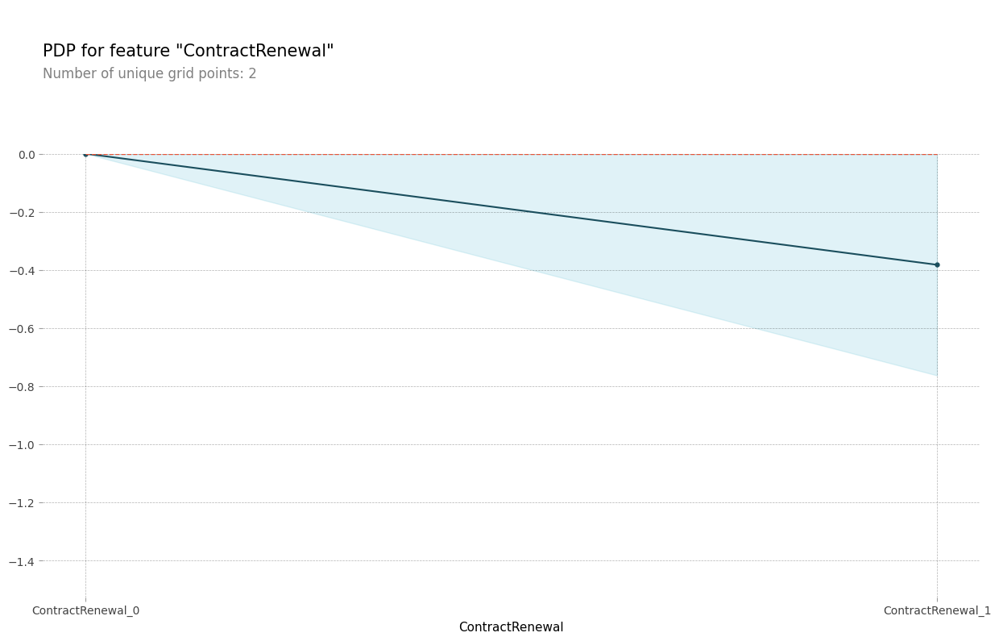

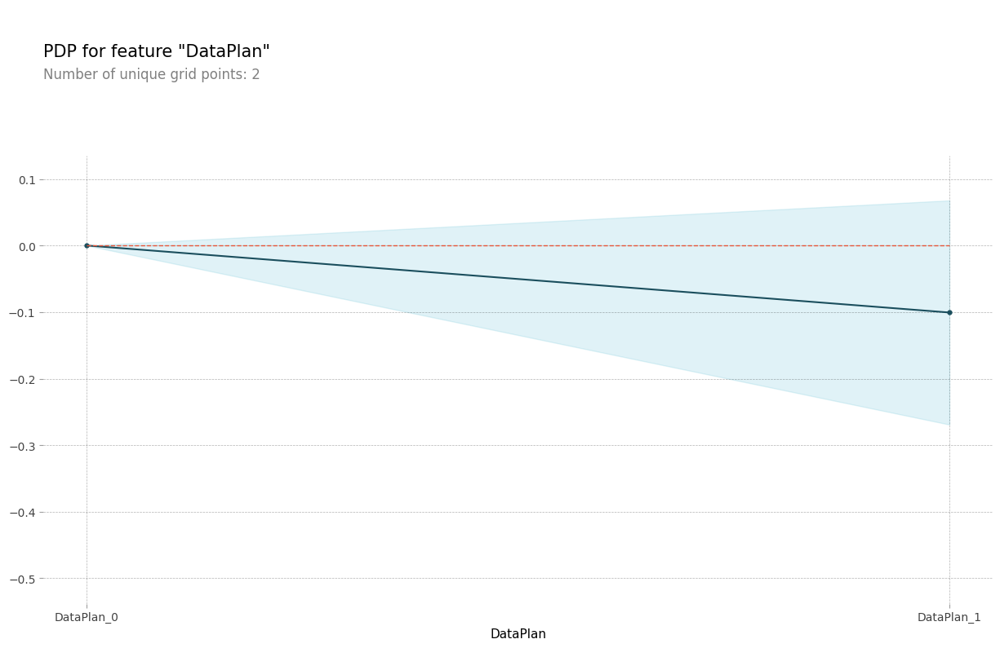

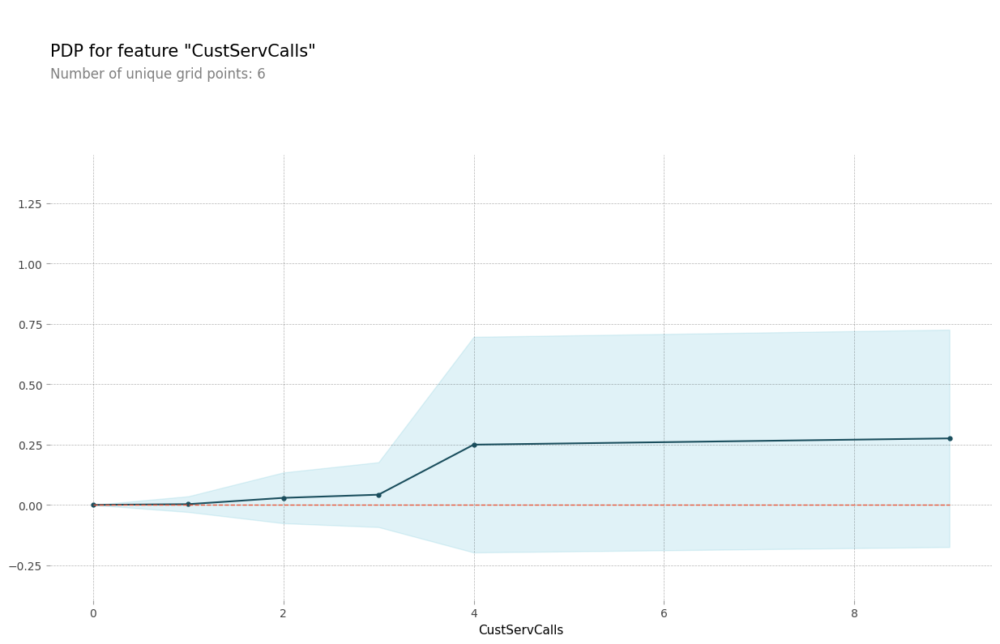

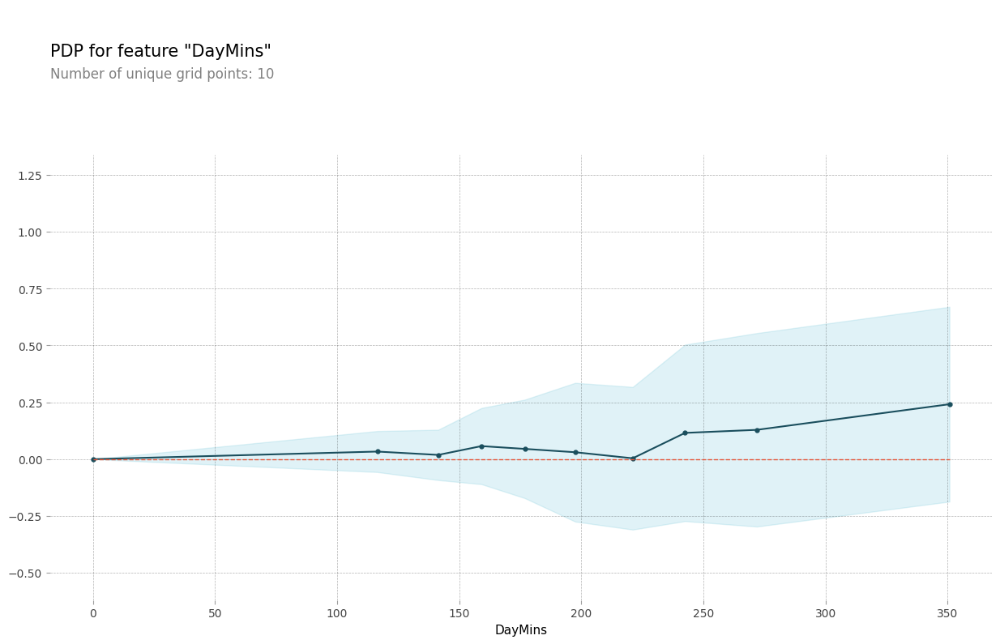

In [ ]:
# plot the PD univariate plot
#plot_pdp(clf, X_train, 'ContractRenewal')
columnasPDP = ['ContractRenewal', 'DataPlan', 'CustServCalls', 'DayMins']
for columna in columnasPDP:
  plot_pdp(clf, X_train, columna)

### 4.2.3 Gráfico PD Variante

AttributeError: ignored

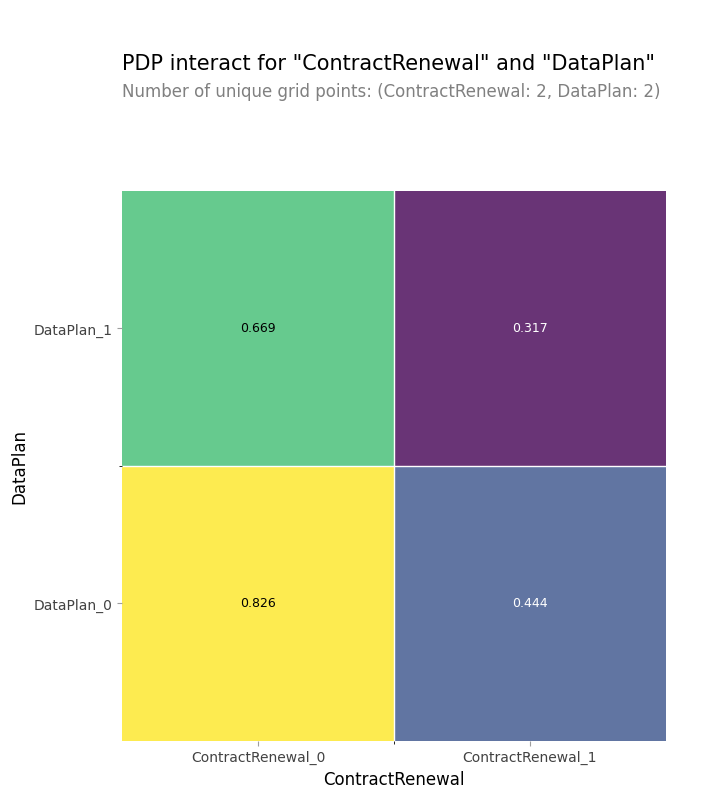

In [ ]:
features_to_plot = ['ContractRenewal', 'DataPlan']
inter1  =  pdp.pdp_interact(model=clf, dataset=X_train, model_features=features_list, features=features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='grid')

plt.show()

### 4.2.4 Interpretación del modelo con SHAP

In [ ]:
#!pip install shap
import shap

# load JS visualization code to notebook
shap.initjs()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 14.6 MB/s eta 0:00:00


In [ ]:
# explicar las predicciones del modelo utilizando los valores SHAP
# (la misma sintaxis funciona para los modelos LightGBM, CatBoost y scikit-learn)
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test)

In [ ]:
X_shap = pd.DataFrame(shap_values)
X_shap.tail()

,0,1,2,3,4,5,6,7,8,9
1135,-0.420692,-0.785625,0.637238,0.359412,-0.153390,1.980682,-0.377866,1.989078,1.495440,0.520725
1136,-0.001393,-0.909495,0.184378,-0.048346,6.226686,1.055236,-0.255703,0.321011,-0.072293,0.088609
1137,0.043395,-0.911359,0.255585,0.027164,-0.400544,-1.311993,0.031298,-0.777437,0.089379,0.070060
1138,-0.334569,-0.636373,0.172895,0.041030,5.187846,0.241767,-1.504758,0.025911,0.051391,0.281196
1139,-0.447687,-1.203902,0.293717,-0.433981,-0.366454,-0.759588,-0.235197,-0.666037,0.466142,0.430368


In [ ]:
print('Expected Value: ', explainer.expected_value)

Expected Value:  -0.021589283


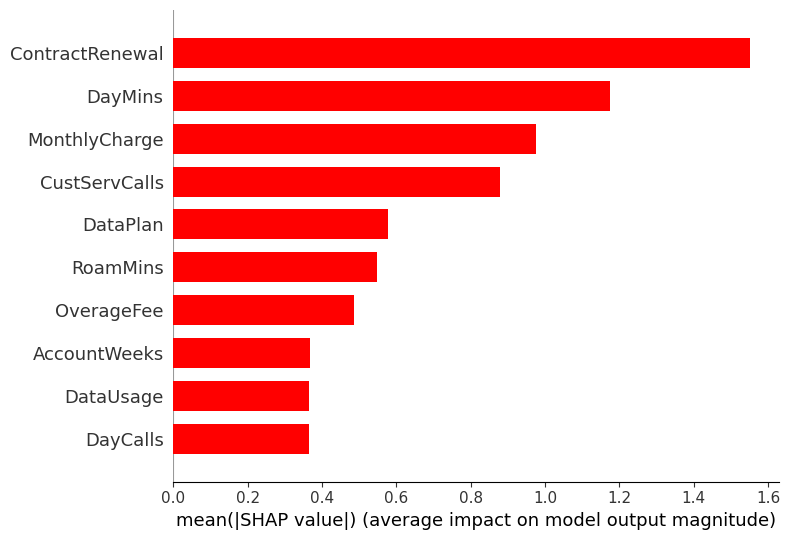

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar", color='red')

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[100,:], X_test.iloc[100,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[44,:], X_test.iloc[44,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_test.iloc[:1000,:])

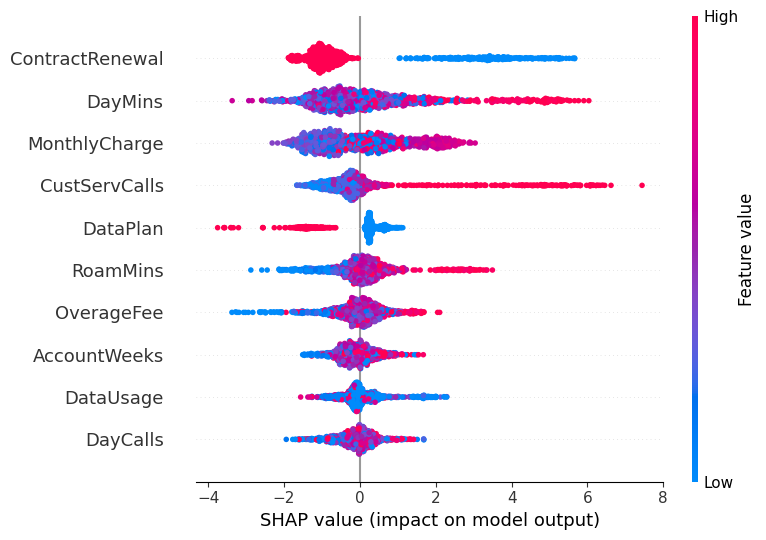

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X_test)

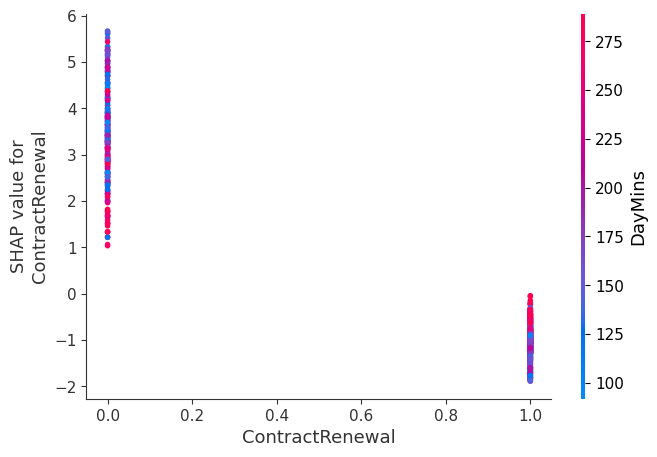

In [ ]:
shap.initjs()
shap.dependence_plot(ind='ContractRenewal', interaction_index='DayMins',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

### 4.2.5 FairML

In [ ]:
#!pip install https://github.com/adebayoj/fairml/archive/master.zip

from fairml import audit_model
from fairml import plot_dependencies

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 7.5 MB 13.4 MB/s 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fairml: filename=fairml-0.1.1.5-py3-none-any.whl size=9435 sha256=940347925b870fd4dbecab83470d1c7567185897f927c13d0c63934ed4bc89d1
  Stored in directory: /tmp/pip-ephem-wheel-cache-1wuchtim/wheels/b8/43/c1/cb98b17b7532c07825d3b9e6311dc164e99d633cd0bc02914f
Successfully built fairml


In [ ]:
xgb_fair = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)

xgb_fair.fit(X_train.values, y_train, eval_metric = 'logloss')

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=33, ...)

In [ ]:
# call audit model
feat_importances, _ = audit_model(xgb_fair.predict, X_train, distance_metric='accuracy', direct_input_pertubation_strategy='constant-zero',
                                 number_of_runs=50, include_interactions=True)

# print feature importance
print(feat_importances)

Feature: AccountWeeks,	 Importance: -0.5754385964912281
Feature: ContractRenewal,	 Importance: -0.7850877192982456
Feature: DataPlan,	 Importance: -0.9239035087719298
Feature: DataUsage,	 Importance: 0.8692982456140351
Feature: CustServCalls,	 Importance: 0.6322368421052632
Feature: DayMins,	 Importance: 0.5392543859649123
Feature: DayCalls,	 Importance: -0.5850877192982457
Feature: MonthlyCharge,	 Importance: -0.5684210526315789
Feature: OverageFee,	 Importance: -0.575
Feature: RoamMins,	 Importance: 0.5771929824561404


In [ ]:
# generar un gráfico de dependencia de características
fig = plot_dependencies(
    feat_importances.median(),
    reverse_values=False,
    title="FairML feature dependence XGB model",
    fig_size=(8,3)
    )

# Imprimir a fichero
file_name = "abandono.png"
plt.savefig(file_name, transparent=False, bbox_inches='tight', dpi=250)